# Лекция: Компьютерное зрение
## Основы обработки изображений

**Преподаватель:** Иванов Александр, Т-Банк

**Аудитория:** ФКН ВШЭ, МФТИ

**Дата:** 

---

# Часть 1: Форматы представления картинок

## Вектор vs Растр

### Растровое представление
**Растр** (Raster) — это способ представления изображения как двумерного массива пикселей (picture elements). Каждый пиксель имеет определённую позицию $(x, y)$ и набор значений, описывающих его цвет/интенсивность.

**Математический формализм:**
$$I: \mathbb{Z}^2 \to \mathbb{R}^c$$

где $I(x, y) \in \mathbb{R}^c$ — вектор значений пикселя на позиции $(x, y)$, а $c$ — число каналов.

Для изображения размером $H \times W$ с $c$ каналами: $I \in \mathbb{R}^{H \times W \times c}$

**Преимущества:**
- Естественное представление для пиксельных данных
- Эффективная обработка через свёртки и другие локальные операции
- Простая реализация на GPU

**Недостатки:**
- Большой объём данных
- Масштабирование приводит к потере качества или интерполяции

### Векторное представление
**Вектор** — способ представления изображения через геометрические примитивы: точки, линии, кривые Безье, полигоны.

Каждый объект описывается:
- Координатами контрольных точек
- Параметрами (толщина, цвет)
- Математическими уравнениями

**Преимущества:**
- Компактное представление
- Масштабируемость без потери качества (вплоть до физических ограничений устройства вывода)
- Редактируемость

**Недостатки:**
- Сложность представления сложных естественных сцен
- Требует растеризации для отображения

**Форматы:**
- SVG (Scalable Vector Graphics) — XML-основанный
- PDF — PostScript-основанный
- EPS, AI — для профессиональной графики

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import Circle, Rectangle, Wedge
import imageio
from scipy import ndimage
from skimage import color, filters, morphology, measure
import warnings
import cv2
warnings.filterwarnings('ignore')

# Установим стиль для лучшей визуализации
plt.rcParams['figure.figsize'] = (14, 5)
plt.rcParams['font.size'] = 10

## Растровые форматы: RGB, BGR, YCbCr, HSV/HSB, CMYK, Grayscale, RGBA

### RGB (Red, Green, Blue)

**Определение:**
Аддитивная модель цвета, основанная на смешении трёх монохроматических лучей света.

$$C = R \cdot \mathbf{e}_R + G \cdot \mathbf{e}_G + B \cdot \mathbf{e}_B$$

где $R, G, B \in [0, 255]$ (или $[0, 1]$ в нормализованном виде).

**Физический смысл:**
RGB основан на физиологии человеческого глаза — у нас три типа колбочек, чувствительных к разным длинам волн (красный ~600-700нм, зелёный ~495-570нм, синий ~450-495нм). RGB не покрывает весь видимый спектр, а даёт лишь приближение подпространства всех возможных цветов.

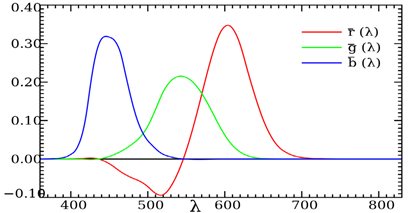

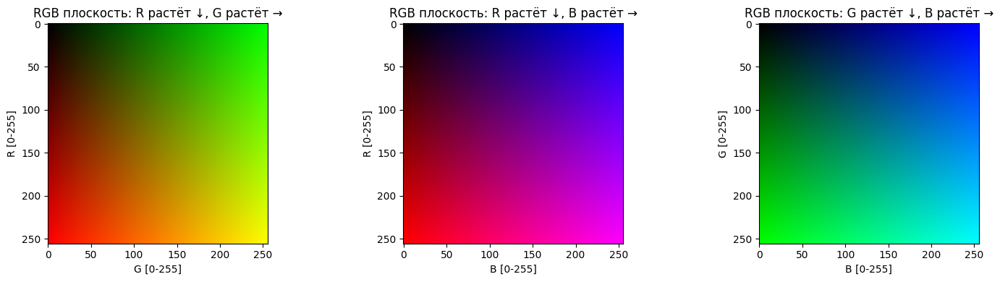

Демонстрация RGB цветового пространства.
Размер RGB изображения: H×W×C = (256, 256, 3)


In [3]:
# Визуализируем RGB цветовое пространство и его кубик
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# Красный канал
red_cube = np.zeros((256, 256, 3), dtype=np.uint8)
for i in range(256):
    red_cube[i, :, 0] = i  # R растёт по вертикали
    red_cube[:, i, 1] = i  # G растёт по горизонтали

axes[0].imshow(red_cube)
axes[0].set_title('RGB плоскость: R растёт ↓, G растёт →')
axes[0].set_xlabel('G [0-255]')
axes[0].set_ylabel('R [0-255]')

# Зелёный канал
green_cube = np.zeros((256, 256, 3), dtype=np.uint8)
for i in range(256):
    green_cube[i, :, 0] = i  # R
    green_cube[:, i, 2] = i  # B

axes[1].imshow(green_cube)
axes[1].set_title('RGB плоскость: R растёт ↓, B растёт →')
axes[1].set_xlabel('B [0-255]')
axes[1].set_ylabel('R [0-255]')

# Синий канал
blue_cube = np.zeros((256, 256, 3), dtype=np.uint8)
for i in range(256):
    blue_cube[i, :, 1] = i  # G
    blue_cube[:, i, 2] = i  # B

axes[2].imshow(blue_cube)
axes[2].set_title('RGB плоскость: G растёт ↓, B растёт →')
axes[2].set_xlabel('B [0-255]')
axes[2].set_ylabel('G [0-255]')

fig.tight_layout()
plt.show()

print("Демонстрация RGB цветового пространства.")
print(f"Размер RGB изображения: H×W×C = {red_cube.shape}")

### BGR — порядок каналов в OpenCV

**Важно:** OpenCV используют порядок BGR вместо RGB (историческая причина, связанная с Intel поддержкой). Это означает, что при загрузке изображения через `cv2.imread()` каналы расположены в порядке Blue-Green-Red.

Преобразование: $\text{RGB} = \text{BGR}[:, :, ::-1]$

### Grayscale (Серая шкала)

**Определение:**
Одноканальное изображение, где каждый пиксель представлен одним числом — интенсивностью.

**Преобразование из RGB:**
$$\text{Gray} = 0.299 \cdot R + 0.587 \cdot G + 0.114 \cdot B$$

Коэффициенты выбраны на основе физиологии глаза — глаз более чувствителен к зелёному свету, менее к красному и очень слабо к синему.

**Или линейное преобразование (для линейных значений, до гамма-коррекции):**
$$L = 0.2126 \cdot R + 0.7152 \cdot G + 0.0722 \cdot B$$

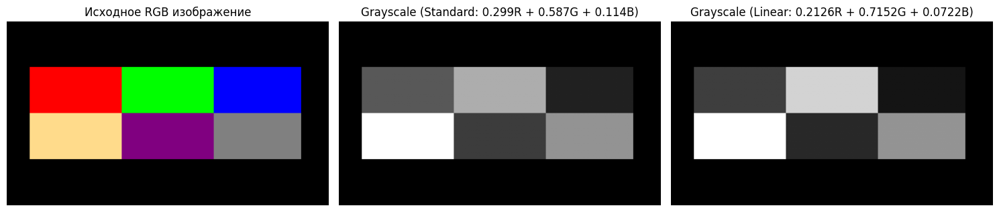

Интенсивность красного в обоих методах:
  Standard: 220
  Linear: 220

Интенсивность зелёного:
  Standard: 52
  Linear: 36


In [5]:
# Простое тестовое изображение
test_rgb = np.zeros((200, 350, 3), dtype=np.uint8)

test_rgb[50:100, 25:125] = [255, 0, 0]     # Красный
test_rgb[50:100, 125:225] = [0, 255, 0]    # Зелёный
test_rgb[50:100, 225:320] = [0, 0, 255]    # Синий
test_rgb[100:150, 25:125] = [255, 219, 139]     # Желтый
test_rgb[100:150, 125:225] = [128, 0, 128]    # Фиолетовый
test_rgb[100:150, 225:320] = [128, 128, 128]    # Серый

# Преобразование в оттенки серого
gray_standard = (0.299 * test_rgb[:,:,0] + 0.587 * test_rgb[:,:,1] + 0.114 * test_rgb[:,:,2]).astype(np.uint8)
gray_linear = (0.2126 * test_rgb[:,:,0] + 0.7152 * test_rgb[:,:,1] + 0.0722 * test_rgb[:,:,2]).astype(np.uint8)

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].imshow(test_rgb)
axes[0].set_title('Исходное RGB изображение')
axes[0].axis('off')

axes[1].imshow(gray_standard, cmap='gray')
axes[1].set_title('Grayscale (Standard: 0.299R + 0.587G + 0.114B)')
axes[1].axis('off')

axes[2].imshow(gray_linear, cmap='gray')
axes[2].set_title('Grayscale (Linear: 0.2126R + 0.7152G + 0.0722B)')
axes[2].axis('off')

fig.tight_layout()
plt.show()

print(f"Интенсивность красного в обоих методах:")
print(f"  Standard: {gray_standard[100, 75]}")
print(f"  Linear: {gray_linear[100, 75]}")
print(f"\nИнтенсивность зелёного:")
print(f"  Standard: {gray_standard[100, 175]}")
print(f"  Linear: {gray_linear[100, 175]}")

### RGBA — RGB с альфа-каналом

**Определение:**
$$C = (R, G, B, A)$$

где $A$ — канал прозрачности (Alpha channel), $A \in [0, 255]$, где:
- $A = 0$ — полностью прозрачный пиксель
- $A = 255$ — полностью непрозрачный пиксель

**Используется при композировании:**
$$C_{\text{result}} = \alpha \cdot C_{\text{foreground}} + (1 - \alpha) \cdot C_{\text{background}}$$

где $\alpha = A / 255$.

### YCbCr — Цветовое разделение яркости и цветности

**Мотивация:**
Человеческий глаз намного более чувствителен к изменениям яркости, чем к изменениям цвета. YCbCr разделяет информацию о яркости (Luma) от информации о цвете (Chroma).


## YCbCr: Физический смысл модели разделения яркости и цветности

### Основные понятия

**YCbCr** (также **YUV**, **YPbPr**) — цветовая модель, разработанная для **эффективного сжатия** и передачи видеосигнала, основанная на принципе разделения **яркости** и **цветности**.

Расшифровка:
- **Y** (Luma) — Яркость, светимость
- **Cb** (Chroma Blue) — Синяя цветоразностная компонента (Blue-difference)
- **Cr** (Chroma Red) — Красная цветоразностная компонента (Red-difference)

---

### Физический смысл и мотивация

#### Физиология зрения человека

**Ключевое наблюдение:** Человеческий глаз **неравномерно чувствителен** к различным аспектам изображения.

**Рецепторы сетчатки:**
- **Палочки** (~120 млн) — чувствительны к яркости (черно-белое зрение), работают при слабом освещении
- **Колбочки** (~6 млн) — чувствительны к цвету (RGB), работают при ярком свете

**Вывод:** Глаз воспринимает **яркость** (~10× лучше) более детально, чем **цвет**.

**Практическое следствие:**
- Можно **снизить разрешение** цветовых каналов без потери качества
- Яркостный канал должен быть полного разрешения

Это основа **субдискретизации цветности** (chroma subsampling) в JPEG, MPEG, H.264.

---

### Исторический контекст

#### Совместимость черно-белого и цветного телевидения (1950-е)

**Проблема:** Как передавать цветное ТВ так, чтобы старые ЧБ-телевизоры продолжали работать?

**Решение:** Стандарт NTSC (1953):
1. **Y-канал** передает яркость → ЧБ-телевизоры показывают только его
2. **Цветовые компоненты** (Cb, Cr) передаются отдельно → цветные ТВ декодируют их дополнительно

**Преимущества:**
- Обратная совместимость
- Экономия полосы пропускания (цвет можно передавать с меньшей частотой дискретизации)

Этот принцип лег в основу всех современных видеокодеков.

---

### Компоненты YCbCr

#### 1. Y (Luma, яркость)

**Физический смысл:** Взвешенная сумма RGB-каналов, учитывающая **чувствительность глаза**.

**Формула (стандарт BT.601 для SD-видео):**

$$
Y = 0.299 \cdot R + 0.587 \cdot G + 0.114 \cdot B
$$

**Формула (стандарт BT.709 для HD-видео):**

$$
Y = 0.2126 \cdot R + 0.7152 \cdot G + 0.0722 \cdot B
$$

**Почему такие коэффициенты?**

Они соответствуют **функции яркости V(λ)** человеческого глаза (фотопическое зрение):
- **Зеленый** (\~550 нм) — максимальная чувствительность (\~71%)
- **Красный** (\~650 нм) — средняя чувствительность (\~21-30%)
- **Синий** (\~450 нм) — минимальная чувствительность (\~7-11%)

**Физическая интерпретация:**
Y аппроксимирует **перцептивную яркость** (как яркость воспринимается человеком), а не физическую интенсивность света.

**Пример:**
- Чистый зеленый (0, 255, 0): Y ≈ 182 (яркий)
- Чистый синий (0, 0, 255): Y ≈ 18 (темный)
- Визуально зеленый действительно кажется ярче синего!

---

#### 2. Cb (Blue-difference, сине-желтая ось)

**Физический смысл:** Разность между синим каналом и яркостью.

$$
C_b = \frac{B - Y}{2 \cdot (1 - 0.114)} = 0.564 \cdot (B - Y)
$$

Или в полной форме (BT.601):

$$
C_b = -0.169 \cdot R - 0.331 \cdot G + 0.500 \cdot B
$$

**Диапазон:** 
- Теоретически: $[-0.5, 0.5]$
- В OpenCV (8-bit): $[0, 255]$, где 128 = нейтраль (нет цвета)

**Интерпретация:**
- $C_b > 128$ → больше синего (blue)
- $C_b < 128$ → больше желтого (yellow)
- $C_b = 128$ → нейтрально (серый)

**Физический смысл:**
Cb кодирует информацию по сине-желтой оси цветового пространства. Это один из **оппонентных каналов** в теории цветового зрения.

---

#### 3. Cr (Red-difference, красно-зеленая ось)

**Физический смысл:** Разность между красным каналом и яркостью.

$$
C_r = \frac{R - Y}{2 \cdot (1 - 0.299)} = 0.713 \cdot (R - Y)
$$

Или в полной форме (BT.601):

$$
C_r = 0.500 \cdot R - 0.419 \cdot G - 0.081 \cdot B
$$

**Диапазон:**
- Теоретически: $[-0.5, 0.5]$
- В OpenCV (8-bit): $[0, 255]$, где 128 = нейтраль

**Интерпретация:**
- $C_r > 128$ → больше красного (red)
- $C_r < 128$ → больше голубого (cyan)
- $C_r = 128$ → нейтрально (серый)

**Физический смысл:**
Cr кодирует информацию по красно-голубой оси. Это второй **оппонентный канал**.

---

### Оппонентная теория цвета

YCbCr основана на **оппонентной модели** цветового зрения (Hering, 1892):

**Нейронные каналы в зрительной системе:**
1. **Ахроматический канал**: яркость (белый ↔ черный) → соответствует Y
2. **Синий-желтый канал**: (синий ↔ желтый) → соответствует Cb
3. **Красный-зеленый канал**: (красный ↔ зеленый) → соответствует Cr

**Экспериментальное подтверждение:**
- Невозможно увидеть "красновато-зеленый" или "синевато-желтый" цвет
- Это связано с тем, что оппонентные сигналы **вычитаются** в мозге

YCbCr моделирует эту нейронную обработку цвета.

---

### Математическая конвертация RGB ↔ YCbCr

#### RGB → YCbCr (стандарт BT.601, full range)

Для нормализованных значений $R, G, B \in [0, 1]$:

$$
\begin{bmatrix} Y \\ C_b \\ C_r \end{bmatrix} = 
\begin{bmatrix} 
0.299 & 0.587 & 0.114 \\
-0.169 & -0.331 & 0.500 \\
0.500 & -0.419 & -0.081
\end{bmatrix}
\begin{bmatrix} R \\ G \\ B \end{bmatrix} +
\begin{bmatrix} 0 \\ 0.5 \\ 0.5 \end{bmatrix}
$$

**Для 8-bit представления** ($R, G, B \in [0, 255]$):

$$
\begin{align}
Y &= 0.299 \cdot R + 0.587 \cdot G + 0.114 \cdot B \\
C_b &= 128 + (-0.169 \cdot R - 0.331 \cdot G + 0.500 \cdot B) \\
C_r &= 128 + (0.500 \cdot R - 0.419 \cdot G - 0.081 \cdot B)
\end{align}
$$

**Важно:** OpenCV использует немного другие коэффициенты для целочисленных операций.

---

#### YCbCr → RGB (обратная конвертация)

$$
\begin{align}
R &= Y + 1.402 \cdot (C_r - 128) \\
G &= Y - 0.344 \cdot (C_b - 128) - 0.714 \cdot (C_r - 128) \\
B &= Y + 1.772 \cdot (C_b - 128)
\end{align}
$$

В матричной форме:

$$
\begin{bmatrix} R \\ G \\ B \end{bmatrix} = 
\begin{bmatrix} 
1.0 & 0.0 & 1.402 \\
1.0 & -0.344 & -0.714 \\
1.0 & 1.772 & 0.0
\end{bmatrix}
\begin{bmatrix} Y \\ C_b - 128 \\ C_r - 128 \end{bmatrix}
$$

---

### Субдискретизация цветности (Chroma Subsampling)

**Ключевая идея:** Снижаем разрешение Cb и Cr без заметной потери качества.

#### Форматы субдискретизации

**Обозначение J:a:b**
- **J** — ширина блока (обычно 4)
- **a** — количество сэмплов цветности в первой строке
- **b** — количество сэмплов во второй строке

**Основные форматы:**

| Формат | Описание | Размер данных | Использование |
|--------|----------|---------------|---------------|
| **4:4:4** | Полное разрешение цветности | 100% | Профессиональное видео, без сжатия |
| **4:2:2** | Половина по горизонтали | 67% | Broadcast-видео, YouTube HD |
| **4:2:0** | Половина по обеим осям | 50% | JPEG, MPEG, DVD, Blu-ray, YouTube |
| **4:1:1** | Четверть по горизонтали | 50% | Старые форматы DV |

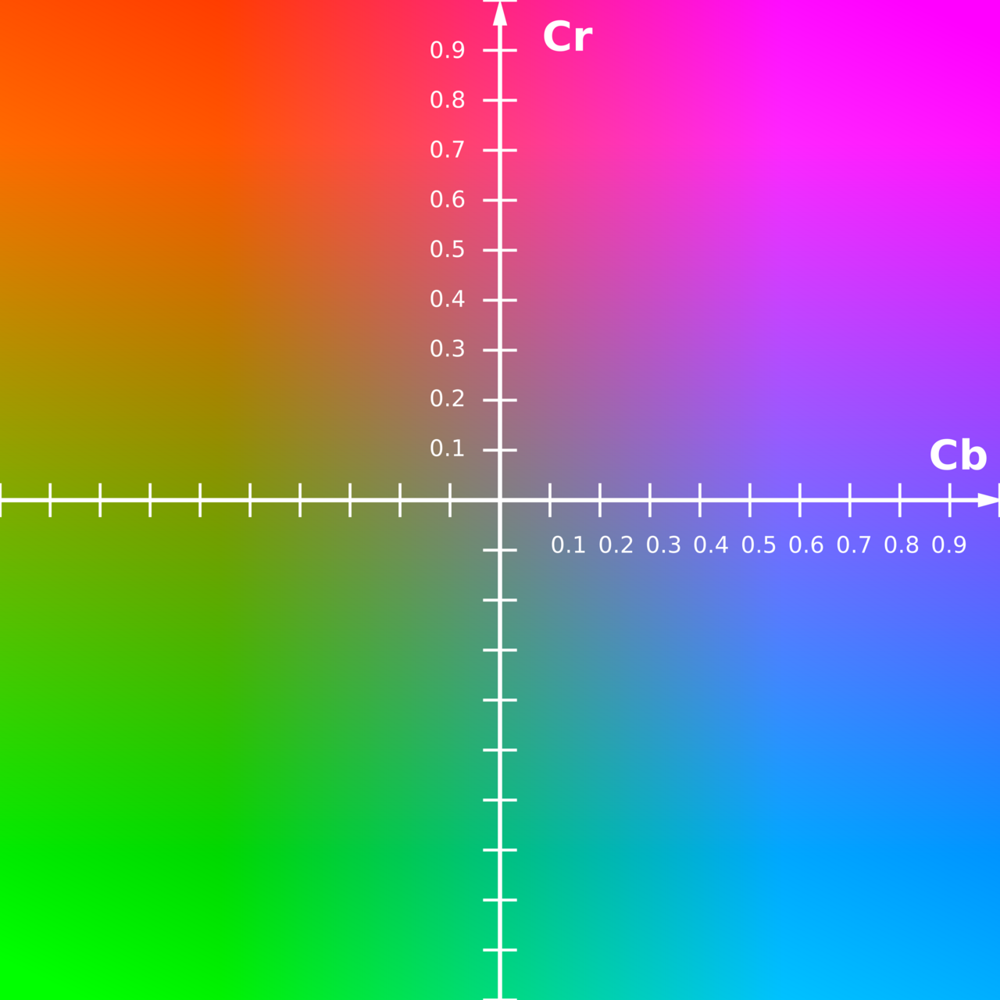

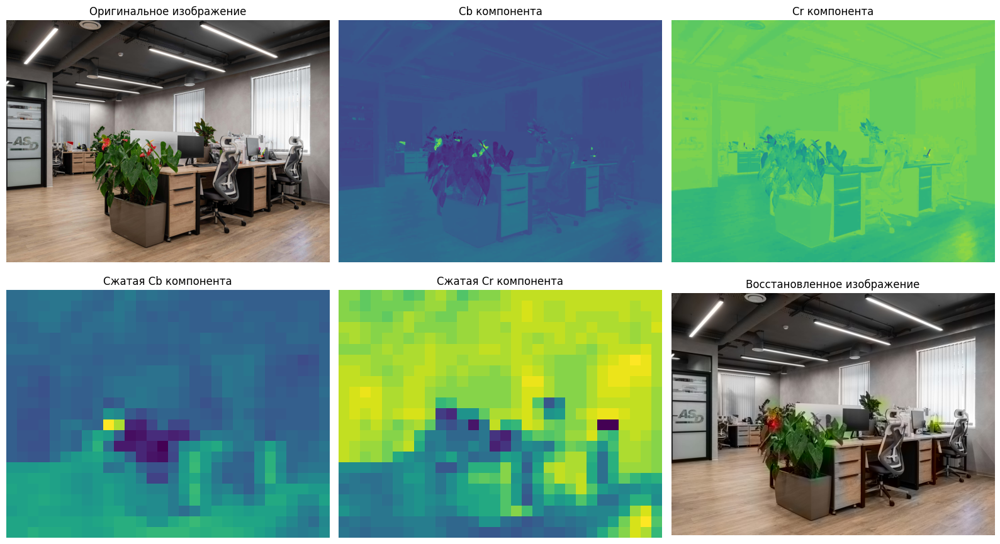

In [6]:
def downsample_upsample(array_2d, factor: int = 128):
    origin_shape = array_2d.shape
    array_2d = array_2d[::factor, ::factor]
    return array_2d, cv2.resize(array_2d, origin_shape[::-1], cv2.INTER_NEAREST)
    

fig, axes = plt.subplots(2, 3, figsize=(16, 9))
axes = axes.ravel()

image = cv2.imread('test_image_1_1.jpg')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# axes[0].imshow(image_rgb)
# axes[0].set_title('Оригинальное изображение')

image_ycbcr = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2YCrCb)

axes[0].imshow(image_rgb)
axes[0].set_title('Оригинальное изображение')
axes[0].axis('off')

axes[1].imshow(image_ycbcr[:, :, 1])
axes[1].set_title('Cb компонента')
axes[1].axis('off')

axes[2].imshow(image_ycbcr[:, :, 2])
axes[2].set_title('Cr компонента')
axes[2].axis('off')

cb_compressed, image_ycbcr[:, :, 1] = downsample_upsample(image_ycbcr[:, :, 1])
cr_compressed, image_ycbcr[:, :, 2] = downsample_upsample(image_ycbcr[:, :, 2])

axes[3].imshow(cb_compressed)
axes[3].set_title('Сжатая Cb компонента')
axes[3].axis('off')

axes[4].imshow(cr_compressed)
axes[4].set_title('Сжатая Cr компонента')
axes[4].axis('off')

image_recovered = cv2.cvtColor(image_ycbcr, cv2.COLOR_YCrCb2RGB)
axes[5].imshow(image_recovered)
axes[5].set_title('Восстановленное изображение')
axes[5].axis('off')

fig.tight_layout()
plt.show()


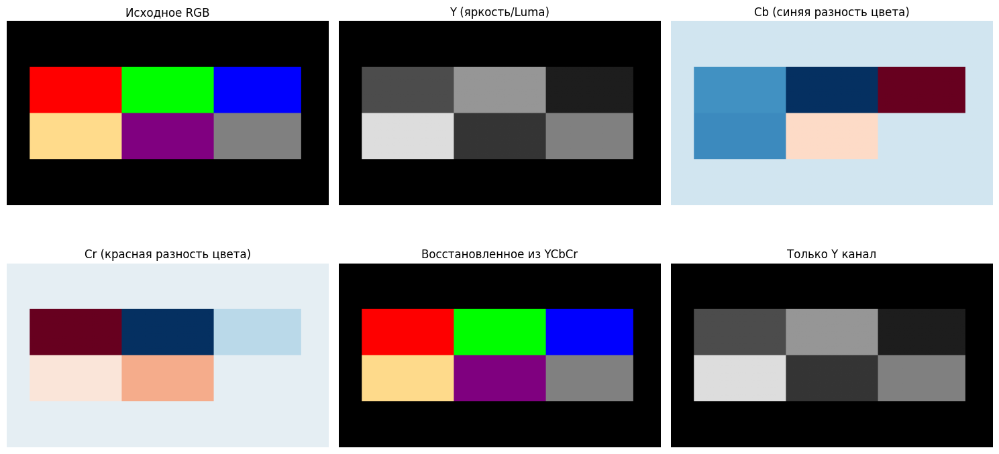

Максимальная ошибка восстановления: 1.0


In [8]:
def rgb2ycbcr(rgb):
    """Преобразование RGB в YCbCr"""
    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    
    y = 0.299 * r + 0.587 * g + 0.114 * b
    cb = 0.564 * (b - y)
    cr = 0.713 * (r - y)
    
    return np.stack([y, cb, cr], axis=-1)

def ycbcr2rgb(ycbcr):
    """Преобразование YCbCr в RGB"""
    y, cb, cr = ycbcr[:,:,0], ycbcr[:,:,1], ycbcr[:,:,2]
    
    r = y + 1.402 * cr
    g = y - 0.344 * cb - 0.714 * cr
    b = y + 1.772 * cb
    
    return np.stack([r, g, b], axis=-1).clip(0, 255).astype(np.uint8)

# Преобразуем тестовое изображение
ycbcr = rgb2ycbcr(test_rgb.astype(np.float32))

fig, axes = plt.subplots(2, 3, figsize=(15, 8))

# Исходное
axes[0, 0].imshow(test_rgb)
axes[0, 0].set_title('Исходное RGB')
axes[0, 0].axis('off')

# Y канал (яркость)
axes[0, 1].imshow(ycbcr[:,:,0], cmap='gray', vmin=0, vmax=255)
axes[0, 1].set_title('Y (яркость/Luma)')
axes[0, 1].axis('off')

# Cb канал (синяя разность цвета)
cb_normalized = ((ycbcr[:,:,1] + 127) / 254 * 255).astype(np.uint8)
axes[0, 2].imshow(cb_normalized, cmap='RdBu_r')
axes[0, 2].set_title('Cb (синяя разность цвета)')
axes[0, 2].axis('off')

# Cr канал (красная разность цвета)
cr_normalized = ((ycbcr[:,:,2] + 127) / 254 * 255).astype(np.uint8)
axes[1, 0].imshow(cr_normalized, cmap='RdBu_r')
axes[1, 0].set_title('Cr (красная разность цвета)')
axes[1, 0].axis('off')

# Восстановленное изображение
rgb_reconstructed = ycbcr2rgb(ycbcr)
axes[1, 1].imshow(rgb_reconstructed)
axes[1, 1].set_title('Восстановленное из YCbCr')
axes[1, 1].axis('off')

# Только Y (черно-белое)
axes[1, 2].imshow(ycbcr[:,:,0], cmap='gray', vmin=0, vmax=255)
axes[1, 2].set_title('Только Y канал')
axes[1, 2].axis('off')

fig.tight_layout()
plt.show()

print(f"Максимальная ошибка восстановления: {np.max(np.abs(test_rgb.astype(np.float32) - rgb_reconstructed.astype(np.float32)))}")

### HSV/HSB — Цилиндрическое представление цвета

**Определение:**
- **H (Hue)** — оттенок, угол на цветовом круге $[0°, 360°]$ или $[0, 1]$
- **S (Saturation)** — насыщенность, как близок цвет к полностью насыщенному $[0, 1]$
- **V (Value)** или **B (Brightness)** — яркость/значение $[0, 1]$

**Преобразование из RGB:**
$$M = \max(R, G, B), \quad m = \min(R, G, B), \quad \Delta = M - m$$

$$H = \begin{cases}
60° \cdot (\frac{G - B}{\Delta} \mod 6) & \text{if } M = R \\
60° \cdot (\frac{B - R}{\Delta} + 2) & \text{if } M = G \\
60° \cdot (\frac{R - G}{\Delta} + 4) & \text{if } M = B
\end{cases}$$

$$S = \begin{cases}
0 & \text{if } M = 0 \\
\frac{\Delta}{M} & \text{otherwise}
\end{cases}$$

$$V = M$$

**Преимущества:**
- Интуитивное для человека представление цвета
- Удобно для редактирования (изменение оттенка, насыщенности отдельно)
- Применяется в графических редакторах

## HSV: Физический смысл перцептивной цветовой модели

### Основные понятия

**HSV** (также известна как **HSB**) — перцептивная (интуитивная) цветовая модель, разработанная для **естественного** описания цвета так, как его воспринимает человек.

Расшифровка:
- **H** (Hue) — Оттенок, тон
- **S** (Saturation) — Насыщенность
- **V** (Value) или **B** (Brightness) — Яркость, светлота

---

### Физический смысл и мотивация

#### Проблема RGB

RGB — технически удобная модель (напрямую соответствует пикселям экрана), но **неинтуитивная** для человека:

**Вопрос:** Как в RGB получить "более светлый красный"?
- Ответ: увеличить все три канала? Только красный? Добавить белого?
- Неочевидно и требует опыта

**Вопрос:** Как сделать цвет менее насыщенным?
- Ответ: нужно двигать значения к серому, но как именно?

**HSV решает эту проблему**, разделяя цвет на три **независимых** и **интуитивных** компонента.

---

### Компоненты HSV

#### 1. Hue (Оттенок, H)

**Физический смысл:** Доминирующая длина волны в спектре видимого света.

**Представление:** Угол на цветовом круге (0° - 360°, в OpenCV: 0-179)

$$
H \in [0°, 360°)
$$

**Соответствие цветам:**

| Угол (°) | OpenCV (0-179) | Цвет |
|----------|----------------|------|
| 0° | 0 | Красный (Red) |
| 60° | 30 | Желтый (Yellow) |
| 120° | 60 | Зеленый (Green) |
| 180° | 90 | Голубой (Cyan) |
| 240° | 120 | Синий (Blue) |
| 300° | 150 | Пурпурный (Magenta) |
| 360° | 179/0 | Красный (возврат) |

**Физическая интерпретация:**
- Hue соответствует **спектральной чистоте** цвета
- Это "чистый" цвет радуги без примеси белого или черного
- Например: H=0° — чистый красный, независимо от яркости или насыщенности

**Особенность:** Оттенок — **циклическая** величина (0° = 360°). Это связано с тем, что красный и фиолетовый находятся на противоположных концах спектра, но визуально близки.

---

#### 2. Saturation (Насыщенность, S)

**Физический смысл:** Степень "чистоты" цвета, количество белого/серого в смеси.

**Представление:** Процент от 0% до 100% (в OpenCV: 0-255)

$$
S \in [0, 1] \quad \text{или} \quad [0\%, 100\%]
$$

**Интерпретация:**

| S | Описание | Пример |
|---|----------|--------|
| 0% | Полностью ненасыщенный (серый) | Оттенок H не имеет значения |
| 50% | Пастельный, приглушенный цвет | Розовый, мятный |
| 100% | Максимально насыщенный, "чистый" цвет | Яркий красный, синий |

**Физическая модель:**

$$
\text{Цвет} = (1 - S) \cdot \text{Серый} + S \cdot \text{Чистый оттенок}
$$

- При S=0: цвет полностью серый (нет цветовой информации)
- При S=1: цвет максимально "цветной"

**Связь со спектром:**
- Высокая насыщенность — узкий пик в спектре (монохроматический свет)
- Низкая насыщенность — широкий спектр (смесь многих длин волн)

---

#### 3. Value/Brightness (Яркость, V)

**Физический смысл:** Количество света, общая интенсивность.

**Представление:** Процент от 0% до 100% (в OpenCV: 0-255)

$$
V \in [0, 1] \quad \text{или} \quad [0\%, 100\%]
$$

**Интерпретация:**

| V | Описание | Пример |
|---|----------|--------|
| 0% | Черный (отсутствие света) | Независимо от H и S |
| 50% | Средняя яркость | Темные оттенки |
| 100% | Максимальная яркость | Яркие, светлые цвета |

**Физическая модель:**

$$
\text{Итоговый цвет} = V \cdot (\text{Насыщенный цвет})
$$

- При V=0: всегда черный цвет (H и S не важны)
- При V=1: цвет максимально яркий

**Связь с освещением:**
Value моделирует количество света, падающего на объект:
- V=100% — объект полностью освещен
- V=50% — объект в полутени
- V=0% — объект в темноте

---

### Геометрическая модель: конус/цилиндр

HSV можно визуализировать как **конус** или **цилиндр** в 3D:

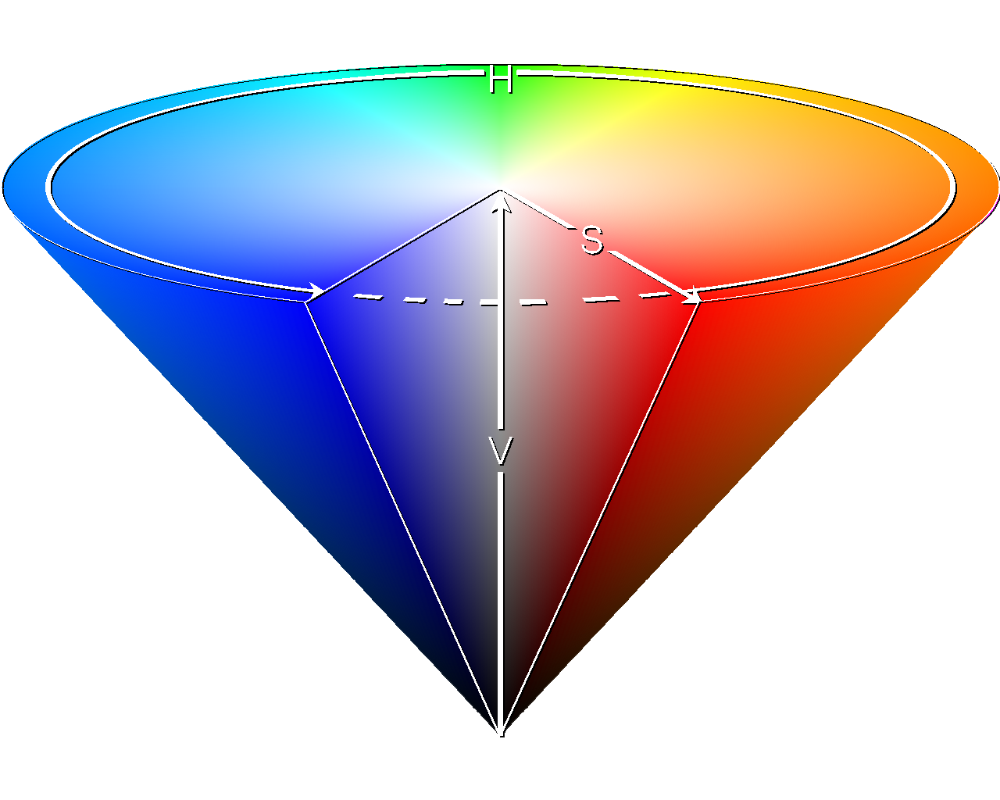

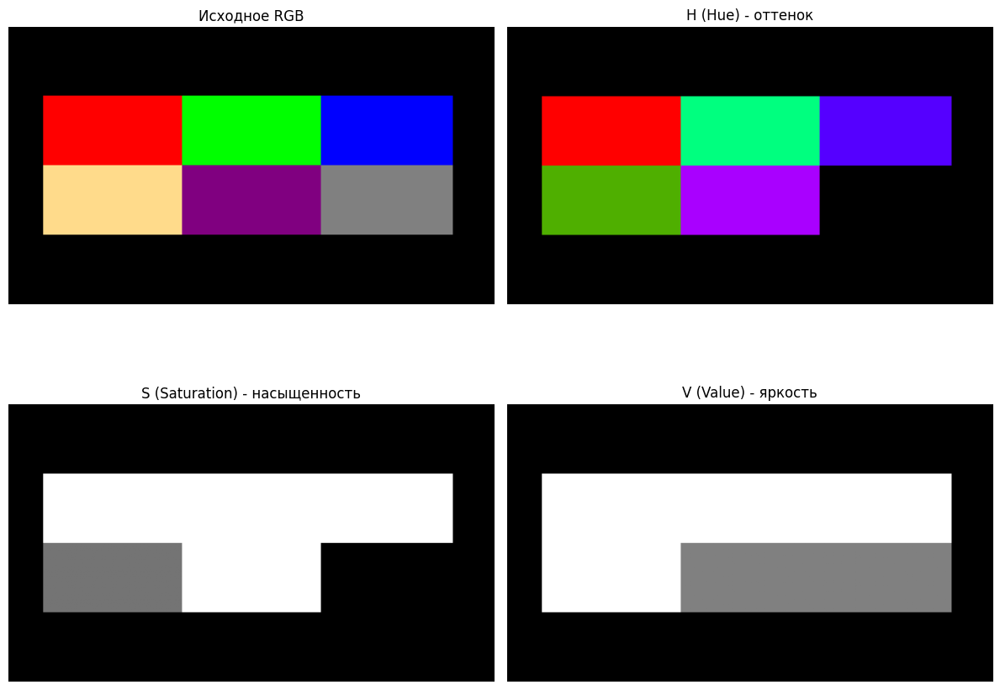

In [9]:
def rgb2hsv_manual(rgb):
    """Преобразование RGB в HSV с нормализацией [0, 1]"""
    rgb_norm = rgb / 255.0
    
    r, g, b = rgb_norm[:,:,0], rgb_norm[:,:,1], rgb_norm[:,:,2]
    
    m = np.minimum(np.minimum(r, g), b)
    M = np.maximum(np.maximum(r, g), b)
    delta = M - m
    
    # Hue
    h = np.zeros_like(r)
    mask_r = (M == r)
    mask_g = (M == g)
    mask_b = (M == b)
    
    h[mask_r] = (60 * np.fmod((g[mask_r] - b[mask_r]) / (delta[mask_r] + 1e-8), 6) + 360) % 360
    h[mask_g] = (60 * ((b[mask_g] - r[mask_g]) / (delta[mask_g] + 1e-8) + 2)) % 360
    h[mask_b] = (60 * ((r[mask_b] - g[mask_b]) / (delta[mask_b] + 1e-8) + 4)) % 360
    
    # Saturation
    s = np.zeros_like(M)
    mask = M != 0
    s[mask] = delta[mask] / M[mask]
    
    # Value
    v = M
    
    return np.stack([h, s, v], axis=-1)

# Преобразуем
hsv = rgb2hsv_manual(test_rgb)

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

axes[0, 0].imshow(test_rgb)
axes[0, 0].set_title('Исходное RGB')
axes[0, 0].axis('off')

# Hue (оттенок) - отображаем как цветовой круг
h_display = np.zeros((*hsv.shape[:2], 3), dtype=np.uint8)
for i in range(hsv.shape[0]):
    for j in range(hsv.shape[1]):
        if hsv[i, j, 1] > 0:  # Если есть насыщенность
            hue_angle = hsv[i, j, 0]
            # Простое отображение: красный 0°, зелёный 120°, синий 240°
            if hue_angle < 60:
                h_display[i, j, 0] = int(255 * (1 - hue_angle / 60))
                h_display[i, j, 1] = int(255 * hue_angle / 60)
            elif hue_angle < 180:
                h_display[i, j, 1] = 255
                h_display[i, j, 2] = int(255 * (hue_angle - 60) / 120)
            else:
                h_display[i, j, 2] = 255
                h_display[i, j, 0] = int(255 * (hue_angle - 180) / 180)

axes[0, 1].imshow(h_display)
axes[0, 1].set_title('H (Hue) - оттенок')
axes[0, 1].axis('off')

# Saturation
axes[1, 0].imshow(hsv[:,:,1], cmap='gray')
axes[1, 0].set_title('S (Saturation) - насыщенность')
axes[1, 0].axis('off')

# Value
axes[1, 1].imshow(hsv[:,:,2], cmap='gray')
axes[1, 1].set_title('V (Value) - яркость')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

### CMYK — Субтрактивная модель (печать)

**Определение:**
- **C (Cyan)** — голубой
- **M (Magenta)** — пурпурный
- **Y (Yellow)** — жёлтый
- **K (Black)** — чёрный

**Физический смысл:**
Субтрактивная модель основана на поглощении света (в отличие от RGB, которая аддитивна). Используется в печати, где краски поглощают свет.

**Преобразование из RGB:**
$$K = 1 - \max(R, G, B)$$
$$C = \frac{1 - R - K}{1 - K}$$
$$M = \frac{1 - G - K}{1 - K}$$
$$Y = \frac{1 - B - K}{1 - K}$$

(значения нормализованы в $[0, 1]$)

**Применение:**
- Полиграфия, печать
- Цветовое управление в производстве
- TIFF файлы часто сохраняют CMYK для печати

## CMYK: Физический смысл субтрактивной цветовой модели

### Основные понятия

**CMYK** — субтрактивная (вычитательная) цветовая модель, используемая в **полиграфии** для цветной печати[web:5].

Расшифровка:
- **C** (Cyan) — Голубой
- **M** (Magenta) — Пурпурный
- **Y** (Yellow) — Желтый
- **K** (Key/blacK) — Черный (ключевой цвет)

---

### Физический принцип работы

#### Отражение света vs излучение

Ключевое отличие CMYK от RGB заключается в **физической природе** формирования цвета[web:6]:

| Модель | Физический принцип | Применение |
|--------|-------------------|------------|
| **RGB** | **Аддитивная** (складывающая): излучение света | Мониторы, экраны, проекторы |
| **CMYK** | **Субтрактивная** (вычитающая): отражение света | Печать на бумаге, ткани, пластике |

**Монитор** — источник света, он сам **излучает** фотоны разных длин волн. Смешивая красный, зеленый и синий свет, получаем белый[web:8].

**Бумага** — поверхность, **отражающая** свет. Она пассивна: падающий белый свет частично поглощается красками, а остаток отражается обратно к нашим глазам[web:6].

---

### Субтрактивный синтез: поглощение спектра

Когда белый свет (содержащий все длины волн) падает на напечатанную поверхность, краски **поглощают** (вычитают) определенные части спектра[web:11]:

#### Поглощение спектра красками:

$$
\begin{align}
\text{Cyan (голубой)} &\rightarrow \text{поглощает красный спектр} \\
\text{Magenta (пурпурный)} &\rightarrow \text{поглощает зеленый спектр} \\
\text{Yellow (желтый)} &\rightarrow \text{поглощает синий спектр} \\
\text{Key (черный)} &\rightarrow \text{поглощает весь спектр}
\end{align}
$$

**Физическая интерпретация:**

1. Белая бумага отражает **весь видимый спектр** → мы видим белый цвет
2. Наносим **голубую** краску → она поглощает красную составляющую, отражает сине-зеленую → видим голубой
3. Добавляем **пурпурную** поверх голубой → поглощается еще и зеленая → остается только синяя → видим синий
4. Смешиваем все три краски (C+M+Y) → поглощается весь спектр → **теоретически** получается черный

---

### Почему нужен черный (K)?

**Проблема CMY-синтеза:**

На практике смешение C+M+Y не дает идеально черного цвета, а лишь грязно-коричневый[web:9]. Причины:

1. **Несовершенство пигментов** — реальные краски поглощают спектр не идеально
2. **Избыточный расход краски** — для получения темных тонов нужно наложить много слоев
3. **Время высыхания** — мокрые слои краски растекаются, теряется четкость

**Решение:** добавление черной краски (Key color)[web:10]:
- Экономия цветных пигментов
- Глубокий насыщенный черный
- Четкие контуры текста и мелких деталей
- Быстрое высыхание

---

### Растрирование: иллюзия смешения

Принтеры **не могут** регулировать плотность краски непрерывно. Поэтому используется **растрирование** (halftoning)[web:5]:

- Изображение разбивается на мелкие **точки** (dots)
- Плотность размещения точек определяет **процент краски** (0-100%)
- На расстоянии точки сливаются → создается иллюзия смешения цветов
- Угол наклона растровых решеток для каждого цвета разный (обычно 15°, 45°, 0°, 75°) → избегаем муара

**Пример:**
- 50% Cyan = голубые точки покрывают 50% площади
- 100% Cyan = сплошной голубой цвет
- 50% Cyan + 50% Magenta = фиолетовый (при удалении точки чередуются)

---

### Математическая связь RGB ↔ CMYK

CMYK и RGB — **дополнительные** (complementary) цвета[web:6]:

$$
\begin{align}
\text{Cyan} &= \text{White} - \text{Red} = \text{Green} + \text{Blue} \\
\text{Magenta} &= \text{White} - \text{Green} = \text{Red} + \text{Blue} \\
\text{Yellow} &= \text{White} - \text{Blue} = \text{Red} + \text{Green}
\end{align}
$$

**Упрощенная конвертация** (без учета профилей):

$$
\begin{pmatrix} C \\ M \\ Y \end{pmatrix} = 
\begin{pmatrix} 1 \\ 1 \\ 1 \end{pmatrix} - 
\begin{pmatrix} R \\ G \\ B \end{pmatrix}
$$

где значения нормализованы в диапазон [0, 1].

**Черный канал** вычисляется через UCR (Under Color Removal):

$$
\begin{align}
K &= \min(C, M, Y) \\
C' &= C - K \\
M' &= M - K \\
Y' &= Y - K
\end{align}
$$

---

### Диапазон цветов (Color Gamut)

**Важное ограничение:** CMYK имеет **меньший цветовой охват**, чем RGB[web:7].

- Некоторые яркие RGB-цвета (например, неоновые оттенки) **физически невозможно** напечатать
- При конвертации RGB → CMYK происходит **потеря насыщенности**
- Поэтому напечатанное изображение часто выглядит тусклее, чем на экране

**Причина:** отраженный свет всегда менее яркий, чем излучаемый[web:8].

---

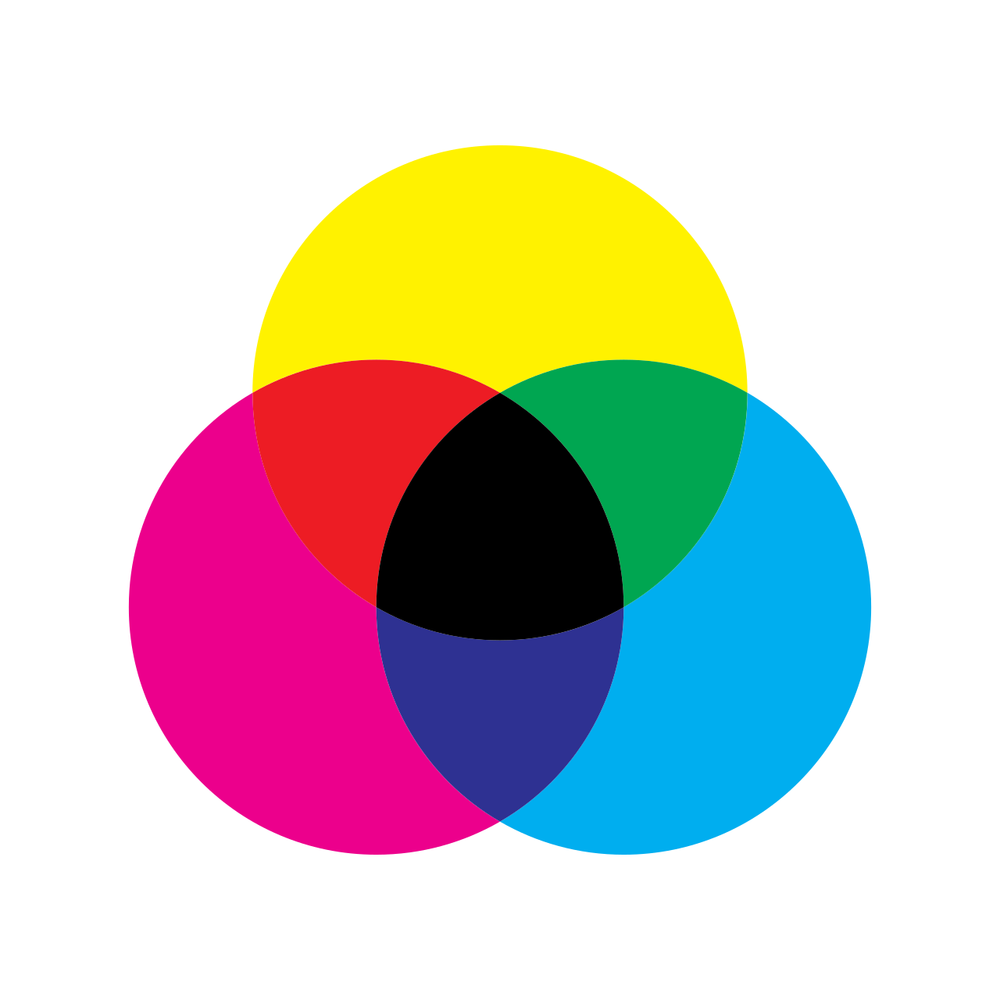

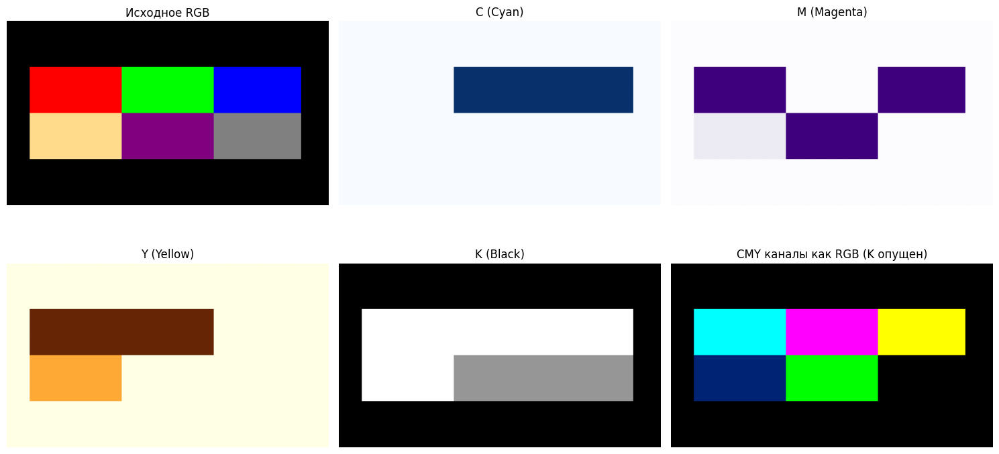

In [10]:
def rgb2cmyk(rgb):
    """RGB [0,255] -> CMYK [0,1]"""
    rgb_norm = rgb.astype(np.float32) / 255.0
    
    k = 1 - np.max(rgb_norm, axis=2)
    
    c = (1 - rgb_norm[:,:,0] - k) / (1 - k + 1e-8)
    m = (1 - rgb_norm[:,:,1] - k) / (1 - k + 1e-8)
    y = (1 - rgb_norm[:,:,2] - k) / (1 - k + 1e-8)
    
    return np.stack([c, m, y, k], axis=-1).clip(0, 1)

cmyk = rgb2cmyk(test_rgb)

fig, axes = plt.subplots(2, 3, figsize=(15, 8))

axes[0, 0].imshow(test_rgb)
axes[0, 0].set_title('Исходное RGB')
axes[0, 0].axis('off')

# Cyan
axes[0, 1].imshow(cmyk[:,:,0], cmap='Blues')
axes[0, 1].set_title('C (Cyan)')
axes[0, 1].axis('off')

# Magenta
axes[0, 2].imshow(cmyk[:,:,1], cmap='Purples')
axes[0, 2].set_title('M (Magenta)')
axes[0, 2].axis('off')

# Yellow
axes[1, 0].imshow(cmyk[:,:,2], cmap='YlOrBr')
axes[1, 0].set_title('Y (Yellow)')
axes[1, 0].axis('off')

# Black
axes[1, 1].imshow(cmyk[:,:,3], cmap='Greys')
axes[1, 1].set_title('K (Black)')
axes[1, 1].axis('off')

# Визуализируем комбинацию
cmyk_viz = np.zeros_like(test_rgb, dtype=np.uint8)
cmyk_viz[:,:,0] = (cmyk[:,:,0] * 255).astype(np.uint8)  # Cyan as R
cmyk_viz[:,:,1] = (cmyk[:,:,1] * 255).astype(np.uint8)  # Magenta as G
cmyk_viz[:,:,2] = (cmyk[:,:,2] * 255).astype(np.uint8)  # Yellow as B

axes[1, 2].imshow(cmyk_viz)
axes[1, 2].set_title('CMY каналы как RGB (K опущен)')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

## Применение разных цветовых пространств

| Формат | Применение | Примечание |
|--------|-----------|----------|
| **RGB** | Дисплеи, веб, основное представление | Аддитивна, используется везде |
| **BGR** | OpenCV | Только в OpenCV по историческим причинам |
| **Grayscale** | Обработка, сжатие, простые алгоритмы | Уменьшает объём в 3 раза |
| **YCbCr** | Видеокодирование, JPEG, MPEG | Позволяет субдискретизировать Cb/Cr |
| **HSV** | Графические редакторы, сегментация по цвету | Интуитивна для человека |
| **CMYK** | Печать, полиграфия | Субтрактивна |

---

# Часть 2: Приемы работы с цветом

## Гамма-коррекция

**Проблема:**
Человеческий глаз воспринимает яркость нелинейно. Кроме того, исторически мониторы и камеры кодируют яркость нелинейно для экономии битов.

**Определение:**
$$V_{\text{encoded}} = V_{\text{linear}}^{1/\gamma}$$

$$V_{\text{linear}} = V_{\text{encoded}}^{\gamma}$$

где $\gamma \approx 2.2$ для стандартного дисплея (sRGB).

**Применение:**
- Исправление недоэкспонированных/переэкспонированных фотографий
- Улучшение контрастности
- Подготовка к алгоритмам, требующим линейного света

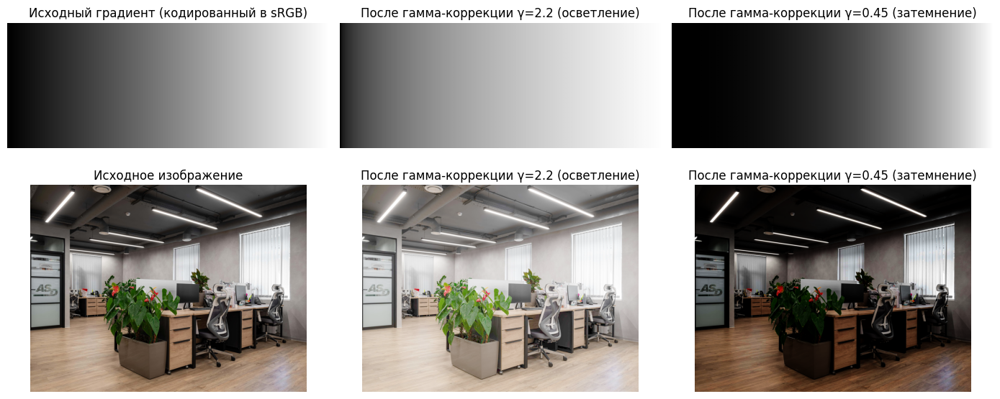

NameError: name 'gamma_dark' is not defined

In [11]:
def apply_gamma(img, gamma):
    """Применить гамма-коррекцию"""
    inv_gamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** inv_gamma) * 255 for i in range(256)]).astype(np.uint8)
    return table[img]

# Создаём градиент для демонстрации
gradient = np.tile(np.linspace(0, 255, 256, dtype=np.uint8), (100, 1))

# И читаем тестовое изображние
image = cv2.imread('test_image_1_1.jpg', cv2.IMREAD_COLOR_RGB)


fig, axes = plt.subplots(2, 3, figsize=(14, 6))

axes = axes.T

axes[0, 0].imshow(gradient, cmap='gray')
axes[0, 0].set_title('Исходный градиент (кодированный в sRGB)')
axes[0, 0].axis('off')

axes[1, 0].imshow(apply_gamma(gradient, 2.2), cmap='gray')
axes[1, 0].set_title('После гамма-коррекции γ=2.2 (осветление)')
axes[1, 0].axis('off')

axes[2, 0].imshow(apply_gamma(gradient, 0.45), cmap='gray')
axes[2, 0].set_title('После гамма-коррекции γ=0.45 (затемнение)')
axes[2, 0].axis('off')

axes[0, 1].imshow(image)
axes[0, 1].set_title('Исходное изображение')
axes[0, 1].axis('off')

axes[1, 1].imshow(apply_gamma(image, 2.2))
axes[1, 1].set_title('После гамма-коррекции γ=2.2 (осветление)')
axes[1, 1].axis('off')

axes[2, 1].imshow(apply_gamma(image, 0.45))
axes[2, 1].set_title('После гамма-коррекции γ=0.45 (затемнение)')
axes[2, 1].axis('off')

fig.tight_layout()
plt.show()

print(f"Пиксель 127 (середина): исходный {gradient[50, 127]}, осветлённый {gamma_dark[50, 127]}, затемнённый {gamma_bright[50, 127]}")

## Гистограмма изображения

**Определение:**
Гистограмма — это функция распределения интенсивности пикселей по уровням яркости.

$$H[i] = \sum_{x,y} \mathbb{1}[I(x,y) = i]$$

где $i \in [0, 255]$ — уровень яркости.

**Применение:**
- Анализ контрастности и экспозиции
- Выравнивание гистограммы (histogram equalization)
- Адаптивное выравнивание (CLAHE)

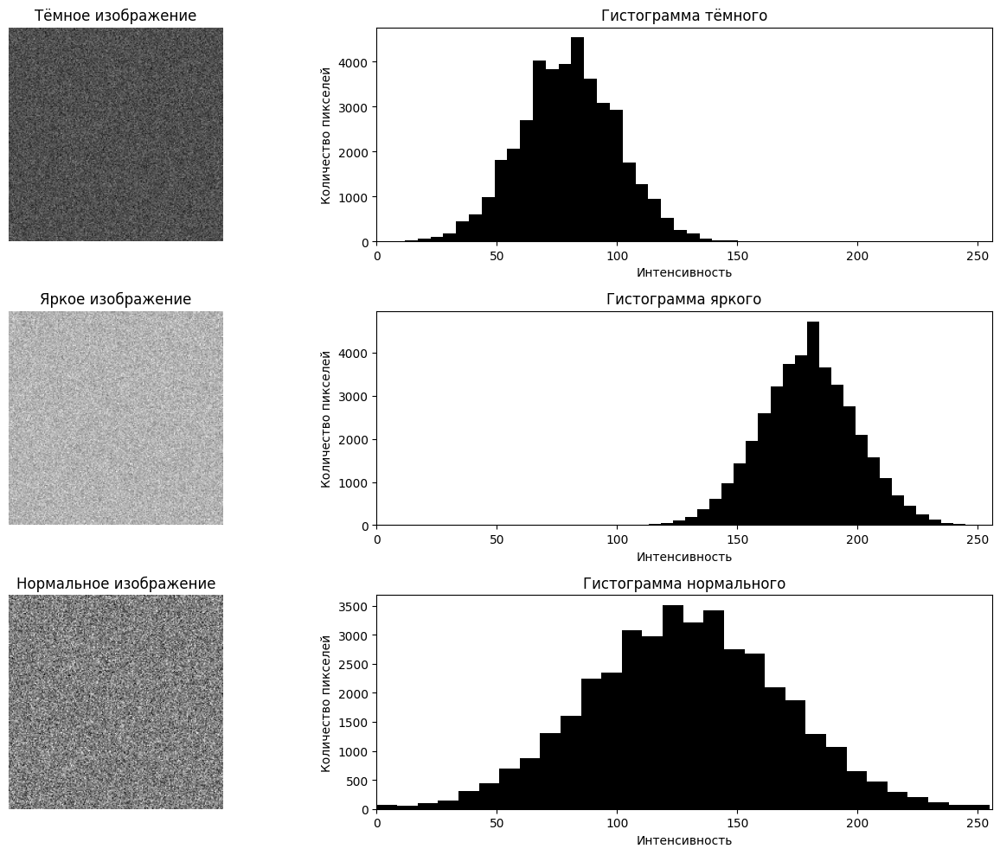

In [13]:
# Создаём несколько тестовых изображений
dark_img = np.uint8(np.random.normal(80, 20, (200, 200)).clip(0, 255))
bright_img = np.uint8(np.random.normal(180, 20, (200, 200)).clip(0, 255))
normal_img = np.uint8(np.random.normal(128, 40, (200, 200)).clip(0, 255))

fig, axes = plt.subplots(3, 2, figsize=(14, 10))

# Тёмное изображение
axes[0, 0].imshow(dark_img, cmap='gray', vmin=0, vmax=255)
axes[0, 0].set_title('Тёмное изображение')
axes[0, 0].axis('off')

axes[0, 1].hist(dark_img.flatten(), bins=30, color='black')
axes[0, 1].set_title('Гистограмма тёмного')
axes[0, 1].set_xlim([0, 256])
axes[0, 1].set_xlabel('Интенсивность')
axes[0, 1].set_ylabel('Количество пикселей')

# Яркое изображение
axes[1, 0].imshow(bright_img, cmap='gray', vmin=0, vmax=255)
axes[1, 0].set_title('Яркое изображение')
axes[1, 0].axis('off')

axes[1, 1].hist(bright_img.flatten(), bins=30, color='black')
axes[1, 1].set_title('Гистограмма яркого')
axes[1, 1].set_xlim([0, 256])
axes[1, 1].set_xlabel('Интенсивность')
axes[1, 1].set_ylabel('Количество пикселей')

# Нормальное изображение
axes[2, 0].imshow(normal_img, cmap='gray', vmin=0, vmax=255)
axes[2, 0].set_title('Нормальное изображение')
axes[2, 0].axis('off')

axes[2, 1].hist(normal_img.flatten(), bins=30, color='black')
axes[2, 1].set_title('Гистограмма нормального')
axes[2, 1].set_xlim([0, 256])
axes[2, 1].set_xlabel('Интенсивность')
axes[2, 1].set_ylabel('Количество пикселей')

plt.tight_layout()
plt.show()

## Изменение яркости, контрастности, насыщенности

**Яркость:**
$$I' = I + \Delta B$$

где $\Delta B$ — смещение (может быть отрицательным).

**Контрастность:**
$$I' = (I - 128) \cdot C + 128$$

где $C > 1$ — увеличение контраста, $C < 1$ — уменьшение.

**Насыщенность (в HSV):**
$$S' = S \cdot k$$

где $k > 1$ — увеличение, $k < 1$ — уменьшение.

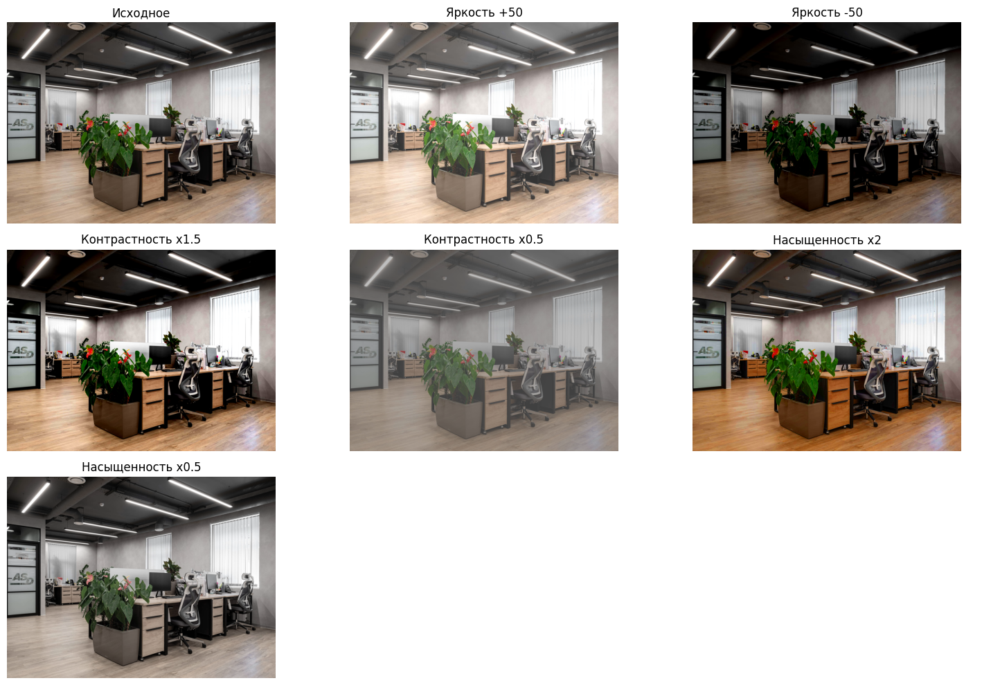

In [14]:
def adjust_brightness(img, delta):
    """Изменить яркость"""
    return np.uint8(np.clip(img.astype(np.float32) + delta, 0, 255))

def adjust_contrast(img, factor):
    """Изменить контрастность"""
    return np.uint8(np.clip((img.astype(np.float32) - 128) * factor + 128, 0, 255))

def adjust_saturation_rgb(img, factor):
    """Изменить насыщенность через конвертацию в HSV"""
    # Конвертируем BGR в HSV
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV).astype(np.float32)
    
    # Изменяем канал S (насыщенность)
    hsv[:, :, 1] = np.clip(hsv[:, :, 1] * factor, 0, 255)
    
    # Конвертируем обратно в BGR
    hsv = hsv.astype(np.uint8)
    result = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    
    return result

image = cv2.imread('test_image_1_1.jpg', cv2.IMREAD_COLOR_RGB)


# Применяем к тестовому RGB изображению
# bright = adjust_brightness(test_rgb, 50)
# dark = adjust_brightness(test_rgb, -50)
# high_contrast = adjust_contrast(test_rgb, 1.5)
# low_contrast = adjust_contrast(test_rgb, 0.5)

# saturated = adjust_saturation_rgb(test_rgb, 1.5)
# desaturated = adjust_saturation_rgb(test_rgb, 0.5)

fig, axes = plt.subplots(3, 3, figsize=(15, 10))

axes[0, 0].imshow(image)
axes[0, 0].set_title('Исходное')
axes[0, 0].axis('off')

axes[0, 1].imshow(adjust_brightness(image, 50))
axes[0, 1].set_title('Яркость +50')
axes[0, 1].axis('off')

axes[0, 2].imshow(adjust_brightness(image, -50))
axes[0, 2].set_title('Яркость -50')
axes[0, 2].axis('off')

axes[1, 0].imshow(adjust_contrast(image, 1.5))
axes[1, 0].set_title('Контрастность x1.5')
axes[1, 0].axis('off')

axes[1, 1].imshow(adjust_contrast(image, 0.5))
axes[1, 1].set_title('Контрастность x0.5')
axes[1, 1].axis('off')

axes[1, 2].imshow(adjust_saturation_rgb(image, 2))
axes[1, 2].set_title('Насыщенность x2')
axes[1, 2].axis('off')

axes[1, 2].imshow(adjust_saturation_rgb(image, 2))
axes[1, 2].set_title('Насыщенность x2')
axes[1, 2].axis('off')

axes[2, 0].imshow(adjust_saturation_rgb(image, 0.5))
axes[2, 0].set_title('Насыщенность x0.5')
axes[2, 0].axis('off')

axes[2, 1].axis('off')
axes[2, 2].axis('off')

plt.tight_layout()
plt.show()

## Баланс белого: Модель серого мира

**Проблема:**
Разные источники света имеют разные цветовые температуры (3000K для лампы накаливания, 5500K для дневного света, 7000K для облачного неба). Камера может неправильно откалиброваться, и изображение получит желтый оттенок.

**Модель серого мира:**
Среднее значение каждого канала должно быть приблизительно одинаковым (серым).

$$\bar{R} = \bar{G} = \bar{B} = \text{const}$$

**Алгоритм:**
1. Вычислить среднее для каждого канала: $\mu_R, \mu_G, \mu_B$
2. Найти глобальное среднее: $\mu = (\mu_R + \mu_G + \mu_B) / 3$
3. Масштабировать каждый канал: $R' = R \cdot (\mu / \mu_R)$, аналогично для G и B

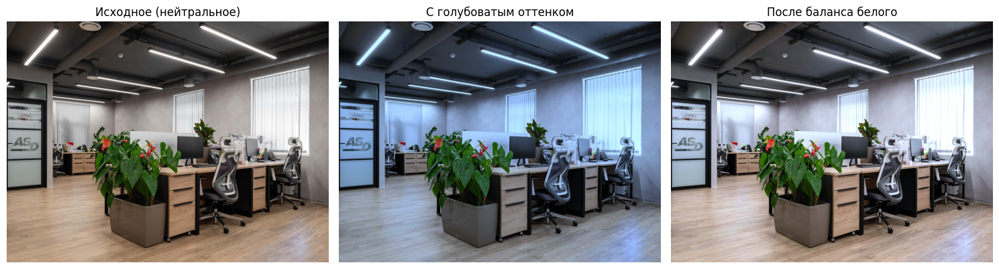

Средние значения каналов:
  Исходное: R=54.3, G=42.5, B=45.1
  С оттенком: R=93.6, G=109.2, B=125.6
  После баланса: R=126.6, G=125.6, B=126.7


In [16]:
import cv2

def white_balance_gray_world(img):
    """Баланс белого методом серого мира"""
    result = img.astype(np.float32)
    
    for c in range(3):
        mean = np.mean(result[:,:,c])
        if mean > 0:
            result[:,:,c] = result[:,:,c] * (127.5 / mean)
    
    return np.uint8(np.clip(result, 0, 255))

# Создаём изображение с цветовым оттенком
img = cv2.imread('test_image_1_1.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

tinted_img = img.copy().astype(np.float32)
tinted_img[:,:,0] *= 0.8   # Меньше красного
tinted_img[:,:,2] *= 1.3   # Больше синего
tinted_img = np.uint8(np.clip(tinted_img, 0, 255))

balanced = white_balance_gray_world(tinted_img)

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].imshow(img)
axes[0].set_title('Исходное (нейтральное)')
axes[0].axis('off')

axes[1].imshow(tinted_img)
axes[1].set_title('С голубоватым оттенком')
axes[1].axis('off')

axes[2].imshow(balanced)
axes[2].set_title('После баланса белого')
axes[2].axis('off')

plt.tight_layout()
plt.show()

print(f"Средние значения каналов:")
print(f"  Исходное: R={test_rgb[:,:,0].mean():.1f}, G={test_rgb[:,:,1].mean():.1f}, B={test_rgb[:,:,2].mean():.1f}")
print(f"  С оттенком: R={tinted_img[:,:,0].mean():.1f}, G={tinted_img[:,:,1].mean():.1f}, B={tinted_img[:,:,2].mean():.1f}")
print(f"  После баланса: R={balanced[:,:,0].mean():.1f}, G={balanced[:,:,1].mean():.1f}, B={balanced[:,:,2].mean():.1f}")

## Бинаризация изображений

### Введение

**Бинаризация (Thresholding)** — это процесс преобразования изображения в градациях серого (или цветного) в **двухуровневое (бинарное) изображение**, содержащее только два значения: обычно 0 (черный, фон) и 255 (белый, объект).

$$
B(x,y) = \begin{cases}
1 & \text{если } I(x,y) > T \\
0 & \text{иначе}
\end{cases}
$$

где:
- $I(x,y)$ — интенсивность пикселя в исходном изображении
- $T$ — порог (threshold)
- $B(x,y)$ — бинарное изображение

### Зачем нужна бинаризация?

Бинаризация является критически важным этапом в задачах:

1. **Распознавание текста (OCR)** — выделение символов от фона
2. **Сегментация объектов** — отделение объектов от фона
3. **Анализ документов** — обработка отсканированных документов
4. **Детектирование контуров** — подготовка изображения для поиска границ
5. **Сжатие изображений** — уменьшение объема данных (2 значения вместо 256)

### Типы методов бинаризации

#### 1. Глобальная бинаризация (Global Thresholding)

Использует **единый порог $T$** для всего изображения.

**Преимущества:**
- Простота реализации
- Высокая скорость обработки
- Хорошо работает при равномерном освещении

**Недостатки:**
- Не справляется с неравномерным освещением
- Плохо работает при наличии теней
- Требует бимодальной гистограммы

**Методы выбора порога:**
- Фиксированный порог (например, $T = 128$)
- Метод Отсу (Otsu) — автоматический выбор оптимального порога
- Метод максимальной энтропии (Kapur)
- Метод минимальной ошибки

#### 2. Локальная (адаптивная) бинаризация (Adaptive Thresholding)

Использует **разные пороги для разных областей** изображения.

**Преимущества:**
- Справляется с неравномерным освещением
- Устойчива к теням и бликам
- Лучше работает на реальных изображениях

**Недостатки:**
- Более сложна в реализации
- Медленнее глобальной
- Требует подбора параметров (размер окна)

### Сравнение подходов

| Критерий | Глобальная | Адаптивная |
|----------|------------|------------|
| **Скорость** | Высокая | Средняя |
| **Освещение** | Равномерное | Неравномерное |
| **Сложность** | Низкая | Средняя |
| **Применение** | Сканы, простые изображения | Фото, документы с тенями |
| **Порог** | Единый для всего изображения | Локальный для каждой области |

---

### Метод Отсу (Otsu's Method)

**Метод Отсу** — это алгоритм **автоматического выбора оптимального порога** для глобальной бинаризации, предложенный Nobuyuki Otsu в 1979 году.

#### Основная идея

Метод основан на предположении, что изображение содержит **два класса пикселей**:
- **Класс 0 (фон)** — пиксели с интенсивностью $[0, T)$
- **Класс 1 (объект)** — пиксели с интенсивностью $[T, 255]$

Алгоритм **перебирает все возможные значения порога** $T \in [0, 255]$ и находит тот порог, который **максимизирует межклассовую дисперсию** (или эквивалентно, **минимизирует внутриклассовую дисперсию**).

#### Математическое описание

Пусть:
- $H = [h_0, h_1, ..., h_{255}]$ — нормализованная гистограмма изображения (вероятности)
- $\omega_0(T)$ — вероятность класса фона
- $\omega_1(T)$ — вероятность класса объекта
- $\mu_0(T)$ — средняя интенсивность фона
- $\mu_1(T)$ — средняя интенсивность объекта

**1. Вероятности классов:**
$$
\omega_0(T) = \sum_{i=0}^{T-1} h_i, \quad \omega_1(T) = \sum_{i=T}^{255} h_i = 1 - \omega_0(T)
$$

**2. Средние интенсивности классов:**
$$
\mu_0(T) = \frac{\sum_{i=0}^{T-1} i \cdot h_i}{\omega_0(T)}, \quad \mu_1(T) = \frac{\sum_{i=T}^{255} i \cdot h_i}{\omega_1(T)}
$$

**3. Межклассовая дисперсия (между классами):**
$$
\sigma_B^2(T) = \omega_0(T) \cdot \omega_1(T) \cdot [\mu_0(T) - \mu_1(T)]^2
$$

**4. Оптимальный порог:**
$$
T^* = \arg\max_{T \in [0, 255]} \sigma_B^2(T)
$$

#### Почему это работает?

**Хорошая бинаризация** означает, что:
- Пиксели внутри каждого класса (фон, объект) **похожи друг на друга** (малая внутриклассовая дисперсия)
- Классы **сильно отличаются** друг от друга (большая межклассовая дисперсия)

Максимизируя $\sigma_B^2$, мы находим порог, который **наилучшим образом разделяет гистограмму** на два класса.

#### Алгоритм

```python
1. Вычислить гистограмму H и нормализовать её (сумма = 1)
2. Для каждого порога T от 0 до 255:
   a. Вычислить ω₀(T), ω₁(T)
   b. Вычислить μ₀(T), μ₁(T)
   c. Вычислить σ²ᵦ(T)
3. Выбрать T* = argmax σ²ᵦ(T)
4. Применить бинаризацию с порогом T*
```

#### Преимущества метода Отсу

✅ **Автоматический выбор порога** — не требует ручной настройки  
✅ **Оптимальность** — максимизирует разделимость классов  
✅ **Простота** — легко реализуется  
✅ **Эффективность** — работает за O(L), где L — число уровней яркости  

#### Ограничения метода Отсу

❌ **Требует бимодальную гистограмму** — плохо работает, если гистограмма не имеет двух выраженных пиков  
❌ **Глобальный порог** — не справляется с неравномерным освещением  
❌ **Чувствительность к шуму** — шум может исказить гистограмму  
❌ **Не учитывает пространственную информацию** — анализирует только распределение яркостей  

#### Когда использовать метод Отсу?

✔️ Равномерное освещение  
✔️ Бимодальная гистограмма (два четких пика)  
✔️ Сканы документов, простые изображения  
✔️ Когда нужна быстрая автоматическая бинаризация  

---

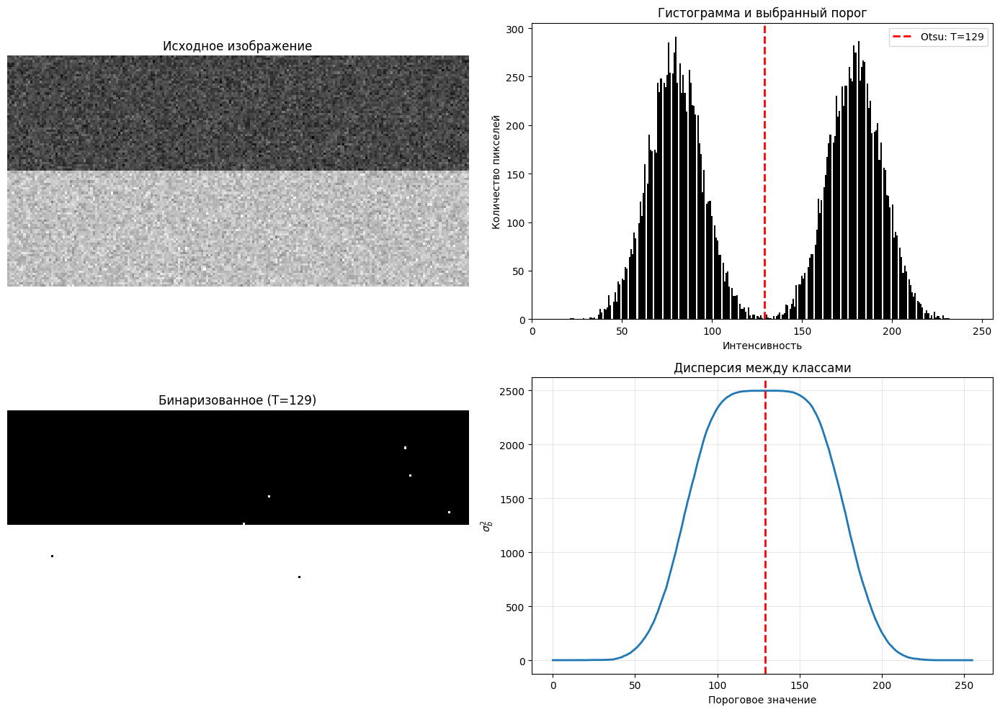

Автоматически выбранный порог (Otsu): 129


In [18]:
def otsu_threshold(img):
    """Метод Otsu для выбора оптимального порога бинаризации"""
    histogram, bin_edges = np.histogram(img, bins=256, range=(0, 256))
    
    # Нормализуем гистограмму
    p = histogram / histogram.sum()
    
    # Вычисляем CDF (кумулятивное распределение)
    omega0 = np.cumsum(p)  # Доля пикселей < T
    omega1 = 1 - omega0     # Доля пикселей >= T
    
    # Средние интенсивности
    mu = np.arange(256) * p
    mu0 = np.cumsum(mu) / (omega0 + 1e-8)
    mu1 = (np.sum(mu) - np.cumsum(mu)) / (omega1 + 1e-8)
    
    # Дисперсия между классами
    sigma_b_sq = omega0 * omega1 * (mu0 - mu1) ** 2
    
    # Находим пороговое значение, максимизирующее дисперсию
    threshold = np.argmax(sigma_b_sq)
    
    return threshold, sigma_b_sq

# Создаём синтетическое изображение с двумя модами распределения
bimodal = np.concatenate([
    np.random.normal(80, 15, 10000),
    np.random.normal(180, 15, 10000)
]).clip(0, 255).astype(np.uint8)

bimodal_img = bimodal.reshape(100, 200)

# Применяем метод Otsu
threshold, sigma_b_sq = otsu_threshold(bimodal_img)
binary = (bimodal_img >= threshold).astype(np.uint8) * 255

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

axes[0, 0].imshow(bimodal_img, cmap='gray')
axes[0, 0].set_title('Исходное изображение')
axes[0, 0].axis('off')

axes[0, 1].hist(bimodal_img.flatten(), bins=256, color='black')
axes[0, 1].axvline(threshold, color='red', linestyle='--', linewidth=2, label=f'Otsu: T={threshold}')
axes[0, 1].set_title('Гистограмма и выбранный порог')
axes[0, 1].set_xlim([0, 256])
axes[0, 1].set_xlabel('Интенсивность')
axes[0, 1].set_ylabel('Количество пикселей')
axes[0, 1].legend()

axes[1, 0].imshow(binary, cmap='gray')
axes[1, 0].set_title(f'Бинаризованное (T={threshold})')
axes[1, 0].axis('off')

axes[1, 1].plot(sigma_b_sq, linewidth=2)
axes[1, 1].axvline(threshold, color='red', linestyle='--', linewidth=2)
axes[1, 1].set_title('Дисперсия между классами')
axes[1, 1].set_xlabel('Пороговое значение')
axes[1, 1].set_ylabel('$\\sigma_b^2$')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"Автоматически выбранный порог (Otsu): {threshold}")

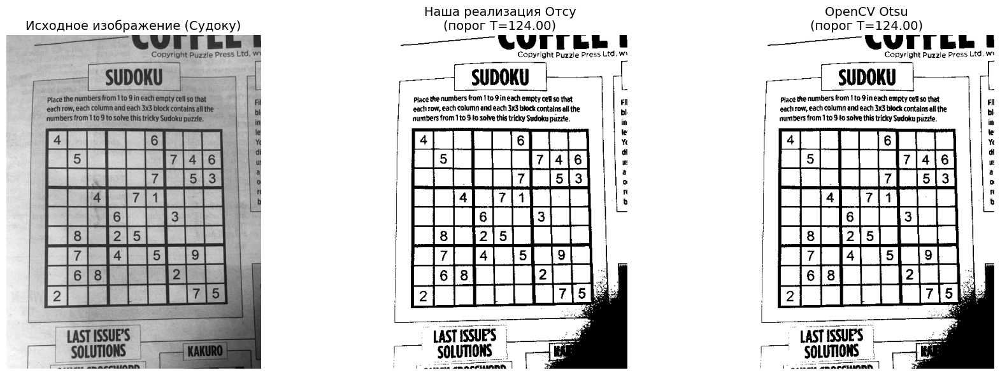

Порог (наша реализация): 124.00
Порог (OpenCV):          124.00
Разница:                 0.00

Бинарные изображения идентичны: True


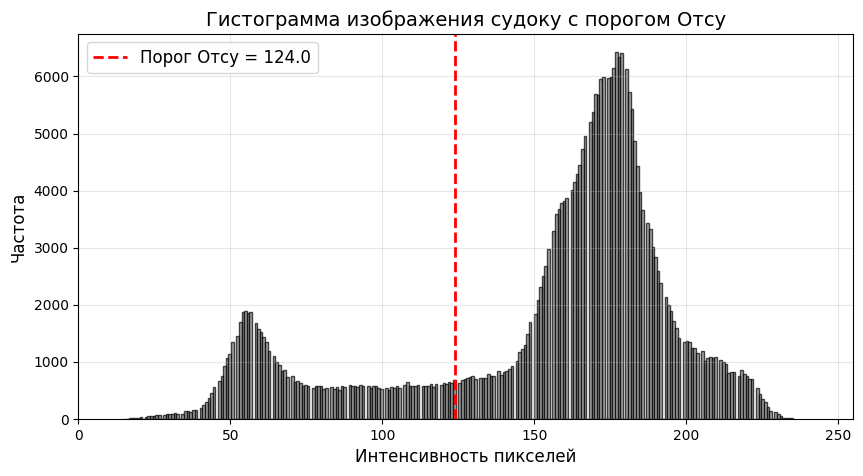

In [19]:
# Пример использования функции otsu_threshold на изображении судоку

# Загрузим изображение судоку
sudoku_img = cv2.imread('test_image_2_1.jpg', cv2.IMREAD_GRAYSCALE)

# Применяем нашу реализацию метода Отсу
threshold_custom, _ = otsu_threshold(sudoku_img)
_, binary_custom = cv2.threshold(sudoku_img, float(threshold_custom), 255, cv2.THRESH_BINARY)

# Сравниваем с встроенной реализацией OpenCV
threshold_opencv, binary_opencv = cv2.threshold(sudoku_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Визуализация
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(sudoku_img, cmap='gray')
axes[0].set_title('Исходное изображение (Судоку)', fontsize=14)
axes[0].axis('off')

axes[1].imshow(binary_custom, cmap='gray')
axes[1].set_title(f'Наша реализация Отсу\n(порог T={threshold_custom:.2f})', fontsize=14)
axes[1].axis('off')

axes[2].imshow(binary_opencv, cmap='gray')
axes[2].set_title(f'OpenCV Otsu\n(порог T={threshold_opencv:.2f})', fontsize=14)
axes[2].axis('off')

plt.tight_layout()
plt.show()

# Проверим, что результаты совпадают
print(f"Порог (наша реализация): {threshold_custom:.2f}")
print(f"Порог (OpenCV):          {threshold_opencv:.2f}")
print(f"Разница:                 {abs(threshold_custom - threshold_opencv):.2f}")
print(f"\nБинарные изображения идентичны: {np.array_equal(binary_custom, binary_opencv)}")

# Построим гистограмму с порогом
plt.figure(figsize=(10, 5))
plt.hist(sudoku_img.flatten(), bins=256, color='gray', alpha=0.7, edgecolor='black')
plt.axvline(threshold_custom, color='red', linestyle='--', linewidth=2, 
            label=f'Порог Отсу = {threshold_custom:.1f}')
plt.title('Гистограмма изображения судоку с порогом Отсу', fontsize=14)
plt.xlabel('Интенсивность пикселей', fontsize=12)
plt.ylabel('Частота', fontsize=12)
plt.xlim(0, 255)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.show()

---

## Адаптивная бинаризация (Adaptive Thresholding)

### Мотивация

Глобальные методы (включая Отсу) используют **один порог для всего изображения**, что не работает при:
- **Неравномерном освещении** (например, тени, блики)
- **Градиентах яркости** (одна часть светлая, другая темная)
- **Локальных вариациях контраста**

**Решение:** использовать **разные пороги для разных областей** изображения.

### Принцип работы

Для каждого пикселя $(x, y)$:
1. Выбирается **локальная окрестность** (окно) размера $w \times w$ вокруг пикселя
2. Вычисляется **локальный порог** $T(x, y)$ на основе пикселей в окне
3. Применяется бинаризация с этим порогом:

$$
B(x,y) = \begin{cases}
1 & \text{если } I(x,y) > T(x,y) \\
0 & \text{иначе}
\end{cases}
$$

### Методы вычисления локального порога

#### 1. Adaptive Mean (Среднее значение)

Порог = **среднее значение** интенсивностей в окне минус константа $C$:

$$
T(x,y) = \frac{1}{w^2} \sum_{(i,j) \in \mathcal{N}(x,y)} I(i,j) - C
$$

где $\mathcal{N}(x,y)$ — окрестность пикселя $(x,y)$ размера $w \times w$.

**Константа $C$** (обычно 2-10) нужна для:
- Компенсации шума
- Коррекции смещения
- Улучшения качества бинаризации

**В OpenCV:** `cv2.ADAPTIVE_THRESH_MEAN_C`

#### 2. Adaptive Gaussian (Взвешенное среднее)

Порог = **взвешенное среднее** (гауссово окно) минус константа $C$:

$$
T(x,y) = \sum_{(i,j) \in \mathcal{N}(x,y)} G(i,j) \cdot I(i,j) - C
$$

где $G(i,j)$ — веса **гауссовой функции**:

$$
G(i,j) = \frac{1}{2\pi\sigma^2} \exp\left(-\frac{(i-x)^2 + (j-y)^2}{2\sigma^2}\right)
$$

Пиксели **ближе к центру** получают **больший вес**, дальние — меньший.

**Преимущество:** более плавные переходы, меньше артефактов.

**В OpenCV:** `cv2.ADAPTIVE_THRESH_GAUSSIAN_C`

### Параметры адаптивной бинаризации

1. **`blockSize`** (размер окна) — размер локальной области ($w$)
   - Должен быть **нечетным числом** (например, 3, 5, 11, 15, 31)
   - **Маленькое окно** (3-7): чувствительно к деталям, но шумное
   - **Большое окно** (15-31): более плавно, но теряет детали
   - **Правило:** выбирать ~2-3 ширины символа/объекта

2. **`C`** (константа вычитания) — смещение порога
   - Положительное значение (обычно 2-10)
   - **Большое $C$**: больше белых пикселей (тоньше линии)
   - **Малое $C$**: больше черных пикселей (толще линии)

### Алгоритм (OpenCV)

```python
binary = cv2.adaptiveThreshold(
    src,           # Входное изображение (grayscale)
    maxValue,      # Значение для пикселей > порога (обычно 255)
    adaptiveMethod, # ADAPTIVE_THRESH_MEAN_C или ADAPTIVE_THRESH_GAUSSIAN_C
    thresholdType,  # THRESH_BINARY или THRESH_BINARY_INV
    blockSize,     # Размер окна (нечетное число)
    C              # Константа вычитания
)
```

### Преимущества адаптивной бинаризации

✅ **Работает при неравномерном освещении**  
✅ **Справляется с тенями и бликами**  
✅ **Не требует бимодальной гистограммы**  
✅ **Лучше для реальных фотографий**  
✅ **Адаптируется к локальным условиям**  

### Недостатки адаптивной бинаризации

❌ **Медленнее** глобальной (нужно обработать окно для каждого пикселя)  
❌ **Требует подбора параметров** (`blockSize`, `C`)  
❌ **Может создавать шум** на однородных областях  
❌ **Чувствительна к размеру окна**  

### Когда использовать адаптивную бинаризацию?

✔️ Неравномерное освещение (фото со вспышкой, тени)  
✔️ Документы с градиентом яркости  
✔️ Изображения с локальными вариациями контраста  
✔️ Когда глобальная бинаризация не работает  
✔️ OCR на фотографиях (не сканах)  

### Сравнение методов

| Метод | Скорость | Освещение | Применение |
|-------|----------|-----------|------------|
| **Otsu (глобальный)** | Быстро | Равномерное | Сканы, простые изображения |
| **Adaptive Mean** | Средне | Неравномерное | Документы с тенями |
| **Adaptive Gaussian** | Средне | Неравномерное | Фото, сложные изображения |

---

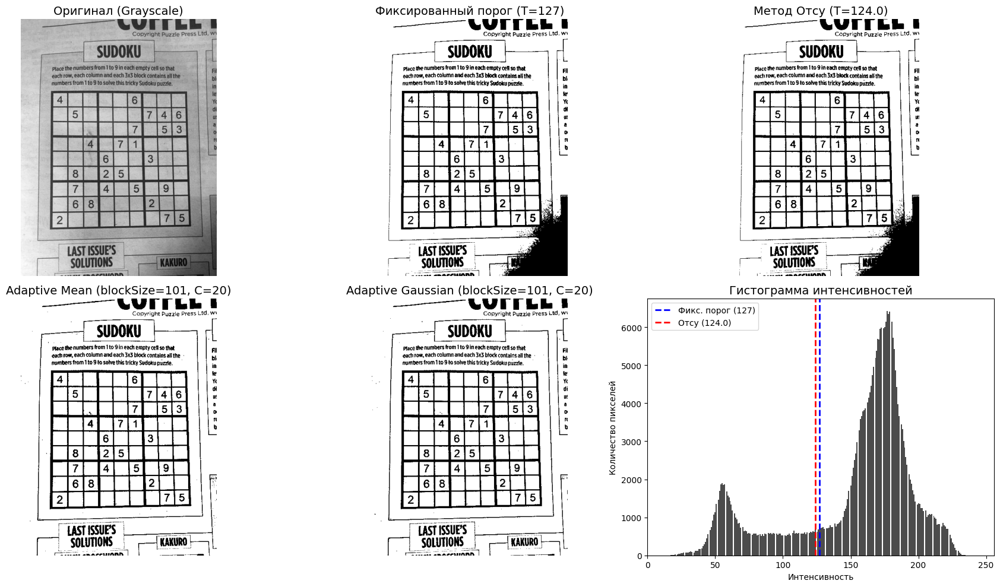

Порог Отсу: 124.00

Сравнение методов:
  Фиксированный: используется T=127 (фиксированное значение)
  Отсу: автоматически выбран T=124.00 (глобальный)
  Adaptive Mean: локальное среднее - C для каждого пикселя
  Adaptive Gaussian: взвешенное среднее (Гаусс) - C для каждого пикселя


In [20]:
# Загрузим тестовое изображение с судоку
sudoku_img = cv2.imread('test_image_2_1.jpg', cv2.IMREAD_GRAYSCALE)

# Применим различные методы бинаризации для сравнения

# 1. Фиксированный порог
_, binary_fixed = cv2.threshold(sudoku_img, 127, 255, cv2.THRESH_BINARY)

# 2. Метод Отсу (глобальный адаптивный порог)
threshold_otsu, binary_otsu = cv2.threshold(sudoku_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# 3. Адаптивная бинаризация (Mean)
binary_adaptive_mean = cv2.adaptiveThreshold(
    sudoku_img,
    maxValue=255,
    adaptiveMethod=cv2.ADAPTIVE_THRESH_MEAN_C,
    thresholdType=cv2.THRESH_BINARY,
    blockSize=101,  # Размер локального окна (должен быть нечетным)
    C=20             # Константа, вычитаемая из среднего
)

# 4. Адаптивная бинаризация (Gaussian)
binary_adaptive_gaussian = cv2.adaptiveThreshold(
    sudoku_img,
    maxValue=255,
    adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    thresholdType=cv2.THRESH_BINARY,
    blockSize=101,
    C=20
)

# Визуализация результатов
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

axes[0, 0].imshow(sudoku_img, cmap='gray')
axes[0, 0].set_title('Оригинал (Grayscale)', fontsize=14)
axes[0, 0].axis('off')

axes[0, 1].imshow(binary_fixed, cmap='gray')
axes[0, 1].set_title('Фиксированный порог (T=127)', fontsize=14)
axes[0, 1].axis('off')

axes[0, 2].imshow(binary_otsu, cmap='gray')
axes[0, 2].set_title(f'Метод Отсу (T={threshold_otsu:.1f})', fontsize=14)
axes[0, 2].axis('off')

axes[1, 0].imshow(binary_adaptive_mean, cmap='gray')
axes[1, 0].set_title('Adaptive Mean (blockSize=101, C=20)', fontsize=14)
axes[1, 0].axis('off')

axes[1, 1].imshow(binary_adaptive_gaussian, cmap='gray')
axes[1, 1].set_title('Adaptive Gaussian (blockSize=101, C=20)', fontsize=14)
axes[1, 1].axis('off')

# Гистограмма исходного изображения
axes[1, 2].hist(sudoku_img.flatten(), bins=256, color='black', alpha=0.7)
axes[1, 2].axvline(127, color='blue', linestyle='--', linewidth=2, label='Фикс. порог (127)')
axes[1, 2].axvline(threshold_otsu, color='red', linestyle='--', linewidth=2, label=f'Отсу ({threshold_otsu:.1f})')
axes[1, 2].set_title('Гистограмма интенсивностей', fontsize=14)
axes[1, 2].set_xlabel('Интенсивность')
axes[1, 2].set_ylabel('Количество пикселей')
axes[1, 2].set_xlim(0, 256)
axes[1, 2].legend()

plt.tight_layout()
plt.show()

print(f"Порог Отсу: {threshold_otsu:.2f}")
print(f"\nСравнение методов:")
print(f"  Фиксированный: используется T=127 (фиксированное значение)")
print(f"  Отсу: автоматически выбран T={threshold_otsu:.2f} (глобальный)")
print(f"  Adaptive Mean: локальное среднее - C для каждого пикселя")
print(f"  Adaptive Gaussian: взвешенное среднее (Гаусс) - C для каждого пикселя")

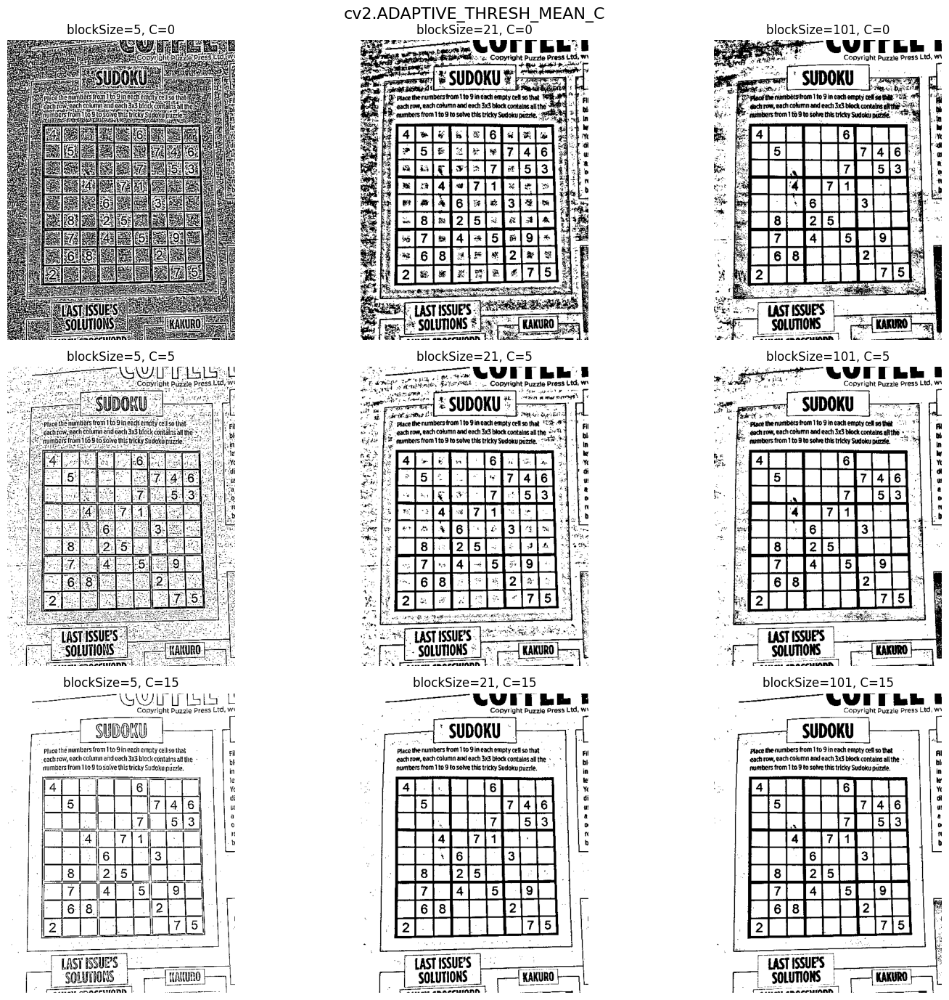

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


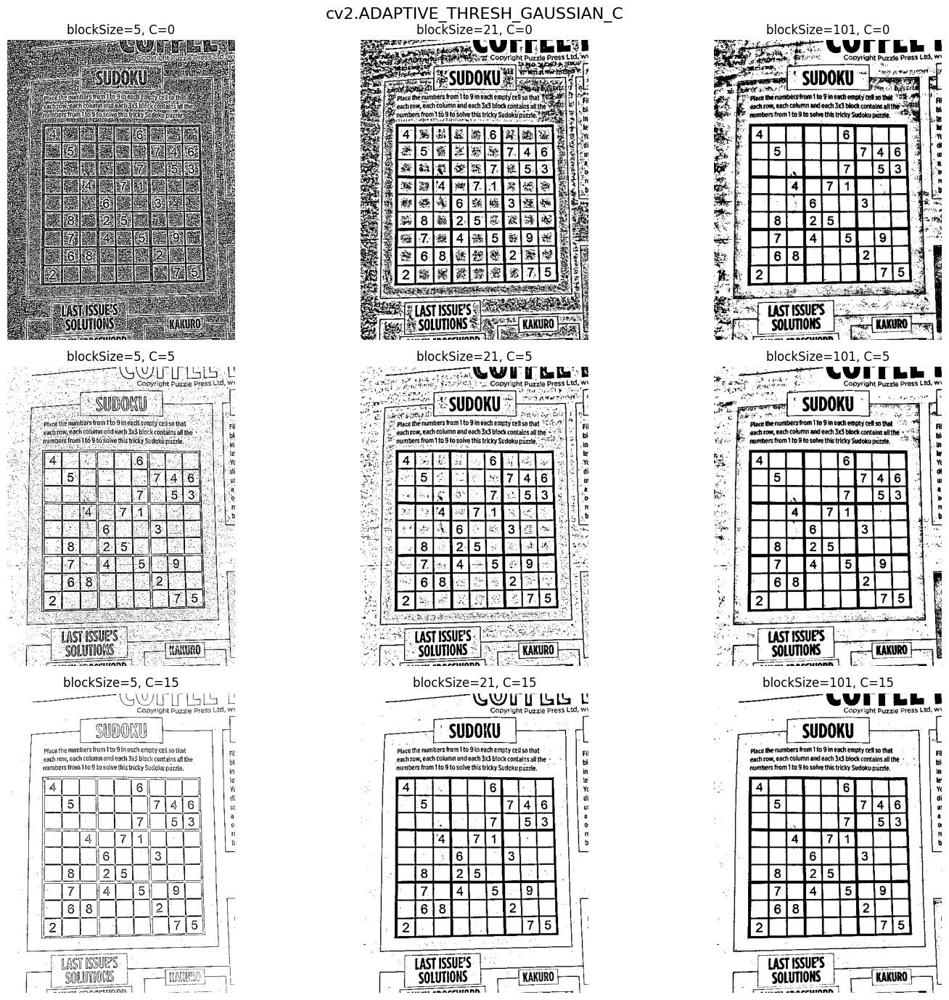

Влияние параметров на адаптивную бинаризацию:

blockSize (размер окна):
  - Малое значение (5): детальная бинаризация, чувствительна к шуму
  - Среднее значение (21): баланс между детализацией и устойчивостью
  - Большое значение (101): сглаженная бинаризация, потеря мелких деталей

C (константа вычитания):
  - C=0: порог равен локальному среднему (больше черных пикселей)
  - C=5: умеренное смещение порога
  - C=15: сильное смещение (больше белых пикселей, тоньше линии)

Mean vs Gaussian:
  - Mean: все пиксели в окне имеют одинаковый вес
  - Gaussian: центральные пиксели имеют больший вес → плавнее переходы


In [21]:
# Демонстрация влияния параметров blockSize и C на результат адаптивной бинаризации

fig, axes = plt.subplots(3, 3, figsize=(16, 14))
fig.suptitle('cv2.ADAPTIVE_THRESH_MEAN_C', fontsize=16)
# Варьируем blockSize
block_sizes = [5, 21, 101]
C_values = [0, 5, 15]

    
for i, bs in enumerate(block_sizes):
    for j, c in enumerate(C_values):
        result = cv2.adaptiveThreshold(
            sudoku_img, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
            cv2.THRESH_BINARY, bs, c
        )
        axes[j, i].imshow(result, cmap='gray')
        axes[j, i].set_title(f'blockSize={bs}, C={c}')
        axes[j, i].axis('off')


plt.tight_layout()
plt.show()

print('-' * 300)

fig, axes = plt.subplots(3, 3, figsize=(16, 14))
fig.suptitle('cv2.ADAPTIVE_THRESH_GAUSSIAN_C', fontsize=16)
# Варьируем blockSize
block_sizes = [5, 21, 101]
C_values = [0, 5, 15]

    
for i, bs in enumerate(block_sizes):
    for j, c in enumerate(C_values):
        result = cv2.adaptiveThreshold(
            sudoku_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
            cv2.THRESH_BINARY, bs, c
        )
        axes[j, i].imshow(result, cmap='gray')
        axes[j, i].set_title(f'blockSize={bs}, C={c}')
        axes[j, i].axis('off')


plt.tight_layout()
plt.show()

print("Влияние параметров на адаптивную бинаризацию:\n")
print("blockSize (размер окна):")
print(f"  - Малое значение ({block_sizes[0]}): детальная бинаризация, чувствительна к шуму")
print(f"  - Среднее значение ({block_sizes[1]}): баланс между детализацией и устойчивостью")
print(f"  - Большое значение ({block_sizes[2]}): сглаженная бинаризация, потеря мелких деталей\n")
print("C (константа вычитания):")
print(f"  - C={C_values[0]}: порог равен локальному среднему (больше черных пикселей)")
print(f"  - C={C_values[1]}: умеренное смещение порога")
print(f"  - C={C_values[2]}: сильное смещение (больше белых пикселей, тоньше линии)\n")
print("Mean vs Gaussian:")
print("  - Mean: все пиксели в окне имеют одинаковый вес")
print("  - Gaussian: центральные пиксели имеют больший вес → плавнее переходы")

### Практические рекомендации по выбору метода бинаризации

#### 🎯 Выбор метода

**Используйте Otsu (глобальный), если:**
- Равномерное освещение по всему изображению
- Четкая бимодальная гистограмма (два пика)
- Сканы документов хорошего качества
- Нужна максимальная скорость
- Пример: отсканированные книги, чистые документы

**Используйте Adaptive (Mean), если:**
- Неравномерное освещение
- Есть тени или градиент яркости
- Документы, сфотографированные на камеру
- Скорость не критична
- Пример: фото документов на телефон, судоку на газете

**Используйте Adaptive (Gaussian), если:**
- Все условия для Adaptive Mean
- + Нужны более плавные переходы
- + Есть локальный шум
- Пример: старые документы, изображения с текстурой

#### ⚙️ Подбор параметров для Adaptive

**blockSize (размер окна):**
```python
blockSize ≈ 2-3 × (ширина_символа_в_пикселях)

# Начальные значения:
# Все очень зависит от размеров картинки!
# - Мелкий текст (10-15px): blockSize = 7-11
# - Средний текст (20-30px): blockSize = 11-21
# - Крупный текст (40+px): blockSize = 21-31
```

**C (константа):**
```python
# Начальное значение: C = 2
# Если линии слишком толстые → увеличить C 
# Если линии слишком тонкие/рваные → уменьшить C
```

#### 🔧 Пайплайн обработки

Рекомендуемая последовательность:

```python
1. Преобразование в grayscale
2. (Опционально) Размытие Гауссом для подавления шума
   img = cv2.GaussianBlur(img, (5, 5), 0)
3. Адаптивная бинаризация
4. (Опционально) Морфологические операции для очистки
   - Opening: удаление мелкого шума
   - Closing: заполнение разрывов в линиях
```


#### 📊 Оценка качества

Если есть ground truth (эталонная бинаризация):
```python
# Метрики качества бинаризации:
from sklearn.metrics import precision_score, recall_score, f1_score

precision = precision_score(ground_truth.flatten(), binary.flatten())
recall = recall_score(ground_truth.flatten(), binary.flatten())
f1 = f1_score(ground_truth.flatten(), binary.flatten())
```

Визуальная оценка:
- Линии текста должны быть непрерывными
- Символы не должны сливаться
- Фон должен быть чистым (без шума)
- Мелкие детали должны сохраняться

---

---

# Часть 3: Блендинг изображений

## Alpha blending

**Определение:**
Смешивание двух изображений с использованием альфа-канала:

$$I_{\text{result}} = \alpha \cdot I_{\text{foreground}} + (1 - \alpha) \cdot I_{\text{background}}$$

где $\alpha \in [0, 1]$ — степень прозрачности переднего плана.

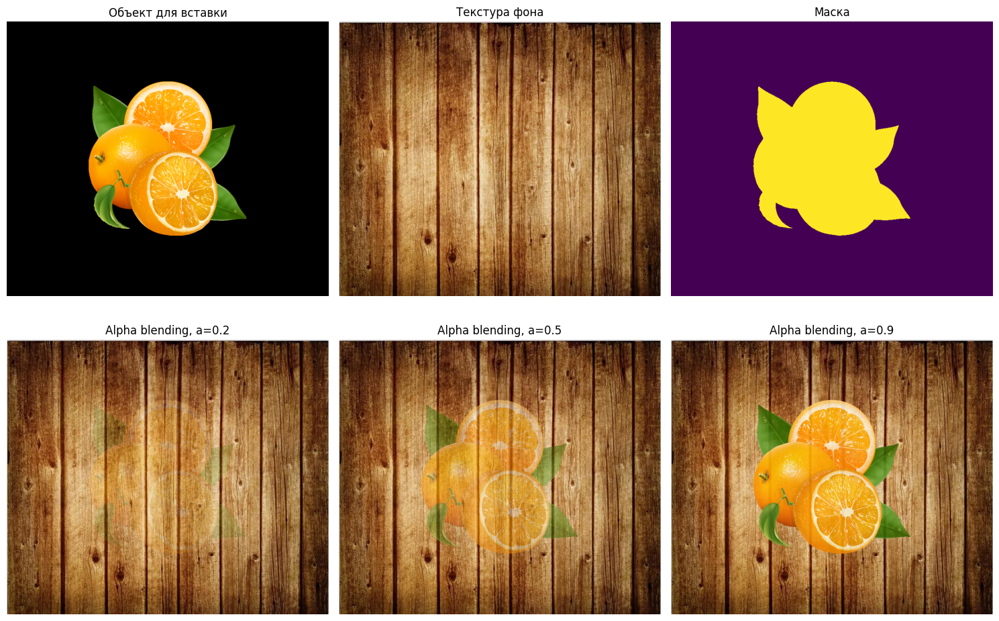

In [22]:
apelsin = cv2.imread('apelsiny.png', cv2.IMREAD_UNCHANGED)
h, w = apelsin.shape[:2]
apelsin = cv2.resize(apelsin, (w // 2, h // 2))
texture = cv2.imread('texture.jpg', cv2.IMREAD_COLOR_RGB)


def pad_to_size(image: np.ndarray, expected_size: tuple[int, int]) -> np.ndarray:
    h, w = image.shape[0], image.shape[1]
    top = (expected_size[0] - h) // 2
    bottom = expected_size[0] - h - top
    left = (expected_size[1] - w) // 2
    right = expected_size[1] - w - left
    return np.pad(image, [[top, bottom], [left, right], [0, 0]], mode='constant')

def alpha_blend(src, dst, mask, alpha):
    return np.where(mask[:, :, None] == 0, dst, src * alpha + dst * (1 - alpha)).clip(0, 255).astype(np.uint8)

apelsin = pad_to_size(apelsin, texture.shape[:2])
mask = (apelsin[:, :, -1] == 255).astype(np.uint8)
apelsin = cv2.cvtColor(apelsin, cv2.COLOR_BGRA2RGB)


fig, axes = plt.subplots(2, 3, figsize=(15, 10))

axes = axes.ravel()

axes[0].imshow(apelsin)
axes[0].set_title('Объект для вставки')
axes[0].axis('off')

axes[1].imshow(texture)
axes[1].set_title('Текстура фона')
axes[1].axis('off')

axes[2].imshow(mask)
axes[2].set_title('Маска')
axes[2].axis('off')

axes[3].imshow(alpha_blend(apelsin, texture, mask, 0.2))
axes[3].set_title('Alpha blending, a=0.2')
axes[3].axis('off')

axes[4].imshow(alpha_blend(apelsin, texture, mask, 0.5))
axes[4].set_title('Alpha blending, a=0.5')
axes[4].axis('off')

axes[5].imshow(alpha_blend(apelsin, texture, mask, 0.9))
axes[5].set_title('Alpha blending, a=0.9')
axes[5].axis('off')



plt.tight_layout()
plt.show()

---

# Часть 4: Фильтрация и обнаружение граней

## Свёртка (Convolution)

**Математическое определение:**

Дискретная 2D свёртка:
$$I' (x, y) = \sum_{i=-k}^{k} \sum_{j=-k}^{k} K(i, j) \cdot I(x+i, y+j)$$

где $K$ — ядро свёртки (kernel) размера $(2k+1) \times (2k+1)$.

**Интерпретация:**
В точке $(x, y)$ вычисляется взвешенная сумма значений пикселей в окрестности.

**Применение:**
- Размытие (блюр)
- Выделение граней
- Повышение резкости
- Обнаружение признаков

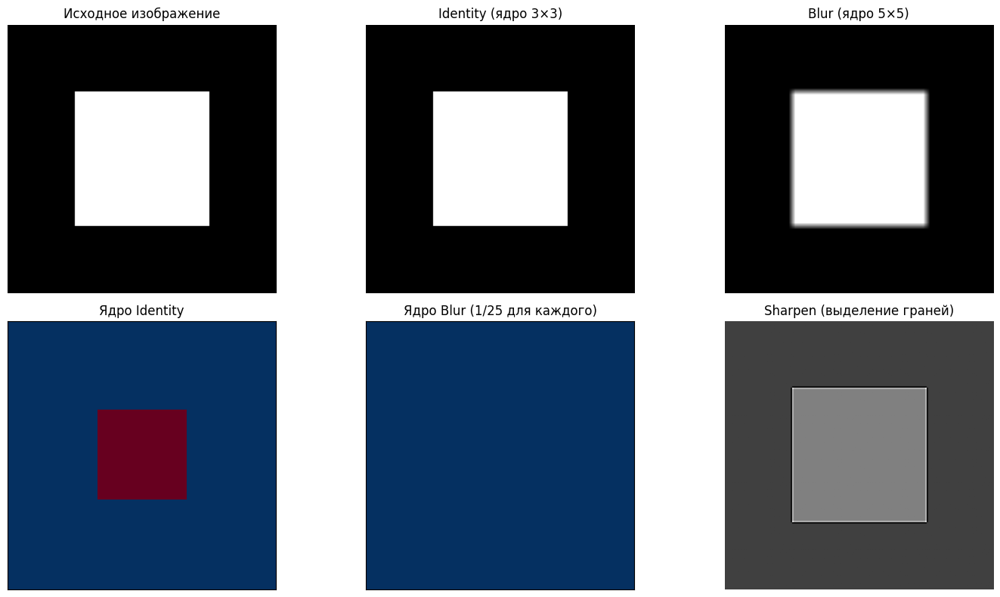

In [23]:
# Создаём синтетическое изображение
synthetic = np.zeros((200, 200), dtype=np.uint8)
synthetic[50:150, 50:150] = 255  # Белый квадрат

# Определяем разные ядра свёртки
kernel_identity = np.array([[0, 0, 0],
                             [0, 1, 0],
                             [0, 0, 0]])

kernel_blur = np.ones((5, 5)) / 25

kernel_sharpen = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]])

# Применяем свёртки
from scipy.signal import convolve2d

result_identity = convolve2d(synthetic, kernel_identity, mode='same', boundary='symm')
result_blur = convolve2d(synthetic.astype(np.float32), kernel_blur, mode='same', boundary='symm')
result_sharpen = convolve2d(synthetic.astype(np.float32), kernel_sharpen, mode='same', boundary='symm')

fig, axes = plt.subplots(2, 3, figsize=(15, 8))

axes[0, 0].imshow(synthetic, cmap='gray')
axes[0, 0].set_title('Исходное изображение')
axes[0, 0].axis('off')

axes[0, 1].imshow(result_identity, cmap='gray')
axes[0, 1].set_title('Identity (ядро 3×3)')
axes[0, 1].axis('off')

im0 = axes[0, 2].imshow(result_blur, cmap='gray', vmin=0, vmax=255)
axes[0, 2].set_title('Blur (ядро 5×5)')
axes[0, 2].axis('off')

# Визуализируем ядра
axes[1, 0].imshow(kernel_identity, cmap='RdBu_r')
axes[1, 0].set_title('Ядро Identity')
axes[1, 0].set_xticks([])
axes[1, 0].set_yticks([])

axes[1, 1].imshow(kernel_blur, cmap='RdBu_r')
axes[1, 1].set_title('Ядро Blur (1/25 для каждого)')
axes[1, 1].set_xticks([])
axes[1, 1].set_yticks([])

im2 = axes[1, 2].imshow(result_sharpen, cmap='gray')
axes[1, 2].set_title('Sharpen (выделение граней)')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

## Оператор Sobel

**Определение:**
Вычисляет приблизительный градиент яркости изображения.

**Ядра Sobel:**

Для горизонтального направления (Sobel-X):
$$K_x = \begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}$$

Для вертикального направления (Sobel-Y):
$$K_y = \begin{bmatrix}
-1 & -2 & -1 \\
0 & 0 & 0 \\
1 & 2 & 1
\end{bmatrix}$$

**Величина градиента:**
$$G = \sqrt{G_x^2 + G_y^2}$$

**Направление:**
$$\theta = \arctan2(G_y, G_x)$$

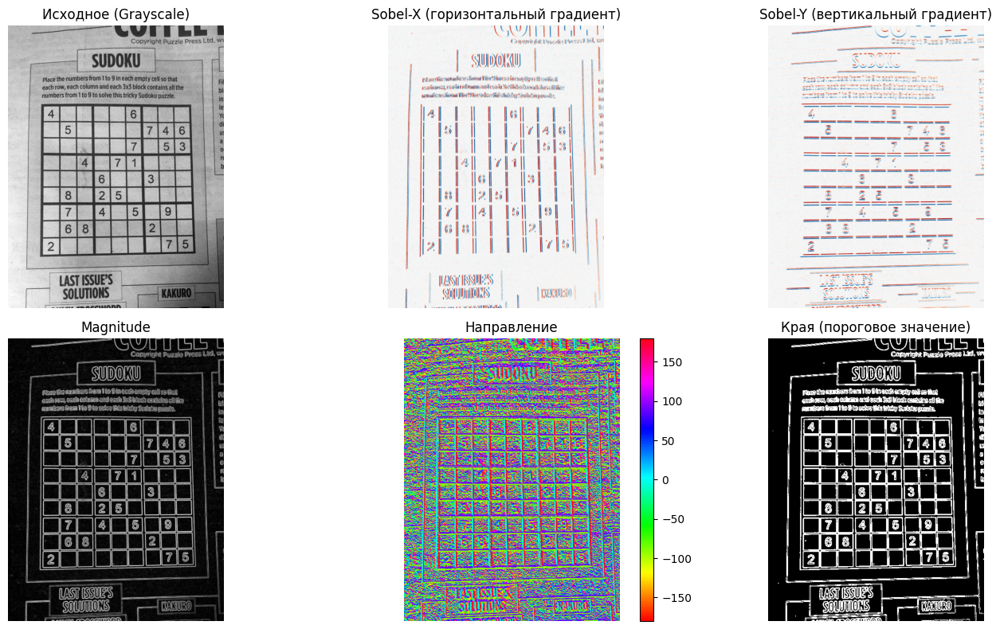

In [25]:
# Ядра Sobel
kernel_sobel_x = np.array([[-1, 0, 1],
                            [-2, 0, 2],
                            [-1, 0, 1]], dtype=np.float32)

kernel_sobel_y = np.array([[-1, -2, -1],
                            [0, 0, 0],
                            [1, 2, 1]], dtype=np.float32)

gray_test = cv2.imread('test_image_2_1.jpg', cv2.IMREAD_GRAYSCALE)

# Применяем к серому изображению
from scipy.signal import convolve2d

gx = convolve2d(gray_test, kernel_sobel_x, mode='same', boundary='symm')
gy = convolve2d(gray_test, kernel_sobel_y, mode='same', boundary='symm')

# Величина и направление градиента
magnitude = np.sqrt(gx**2 + gy**2)
magnitude_normalized = (magnitude / magnitude.max() * 255).astype(np.uint8)
angle = np.arctan2(gy, gx) * 180 / np.pi

fig, axes = plt.subplots(2, 3, figsize=(15, 8))

axes[0, 0].imshow(gray_test, cmap='gray')
axes[0, 0].set_title('Исходное (Grayscale)')
axes[0, 0].axis('off')

axes[0, 1].imshow(gx, cmap='RdBu_r')
axes[0, 1].set_title('Sobel-X (горизонтальный градиент)')
axes[0, 1].axis('off')

axes[0, 2].imshow(gy, cmap='RdBu_r')
axes[0, 2].set_title('Sobel-Y (вертикальный градиент)')
axes[0, 2].axis('off')

axes[1, 0].imshow(magnitude_normalized, cmap='gray')
axes[1, 0].set_title('Magnitude')
axes[1, 0].axis('off')

im = axes[1, 1].imshow(angle, cmap='hsv')
axes[1, 1].set_title('Направление')
axes[1, 1].axis('off')
plt.colorbar(im, ax=axes[1, 1])

# Бинаризованные края
edges = (magnitude_normalized > 50).astype(np.uint8) * 255
axes[1, 2].imshow(edges, cmap='gray')
axes[1, 2].set_title('Края (пороговое значение)')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

## Лапласиан (Laplacian)

**Определение:**
Второй частный дифференциал (Laplacian):
$$\nabla^2 I = \frac{\partial^2 I}{\partial x^2} + \frac{\partial^2 I}{\partial y^2}$$

**Ядро:**
$$K = \begin{bmatrix}
0 & -1 & 0 \\
-1 & 4 & -1 \\
0 & -1 & 0
\end{bmatrix}$$

или 8-связное:
$$K = \begin{bmatrix}
-1 & -1 & -1 \\
-1 & 8 & -1 \\
-1 & -1 & -1
\end{bmatrix}$$

**Применение:**
- Обнаружение краёв (но более чувствителен к шуму чем Sobel)
- Обнаружение blob'ов (Laplacian of Gaussian)
- Выявление второй производной (повышение резкости)

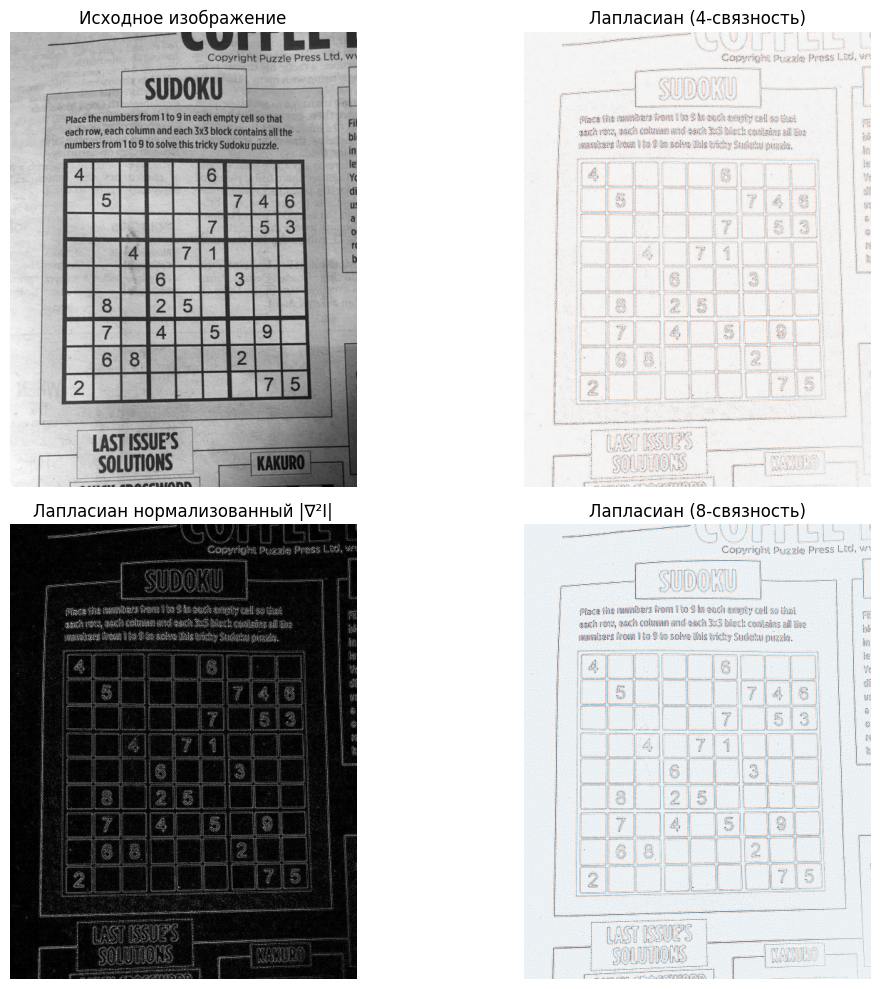

In [26]:
# Ядра Лапласиана
kernel_laplacian_4 = np.array([[0, -1, 0],
                                [-1, 4, -1],
                                [0, -1, 0]], dtype=np.float32)

kernel_laplacian_8 = np.array([[-1, -1, -1],
                                [-1, 8, -1],
                                [-1, -1, -1]], dtype=np.float32)

laplacian_4 = convolve2d(gray_test, kernel_laplacian_4, mode='same', boundary='symm')
laplacian_8 = convolve2d(gray_test, kernel_laplacian_8, mode='same', boundary='symm')

# Нормализуем для визуализации
lap4_norm = np.uint8(np.clip(np.abs(laplacian_4) / np.abs(laplacian_4).max() * 255, 0, 255))
lap8_norm = np.uint8(np.clip(np.abs(laplacian_8) / np.abs(laplacian_8).max() * 255, 0, 255))

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

axes[0, 0].imshow(gray_test, cmap='gray')
axes[0, 0].set_title('Исходное изображение')
axes[0, 0].axis('off')

axes[0, 1].imshow(laplacian_4, cmap='RdBu_r')
axes[0, 1].set_title('Лапласиан (4-связность)')
axes[0, 1].axis('off')

axes[1, 0].imshow(lap4_norm, cmap='gray')
axes[1, 0].set_title('Лапласиан нормализованный |∇²I|')
axes[1, 0].axis('off')

axes[1, 1].imshow(laplacian_8, cmap='RdBu_r')
axes[1, 1].set_title('Лапласиан (8-связность)')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

## Морфологические операции

### Эрозия (Erosion)

**Определение:**
Пиксель устанавливается в 1 (белый) только если ВСЕ пиксели в структурном элементе белые:
$$I'(x, y) = \min_{(i,j) \in SE} I(x+i, y+j)$$

**Эффект:** Уменьшение белых областей, удаление мелких деталей.

### Дилатация (Dilation)

**Определение:**
Пиксель устанавливается в 1 если ХОТЯ БЫ ОДИН пиксель в структурном элементе белый:
$$I'(x, y) = \max_{(i,j) \in SE} I(x+i, y+j)$$

**Эффект:** Расширение белых областей, заполнение дырок.

### Opening и Closing

**Opening** (Erosion → Dilation): удаляет мелкие светлые пятна
$$I_{open} = \text{Dilate}(\text{Erode}(I))$$

**Closing** (Dilation → Erosion): удаляет мелкие тёмные дырки
$$I_{close} = \text{Erode}(\text{Dilate}(I))$$

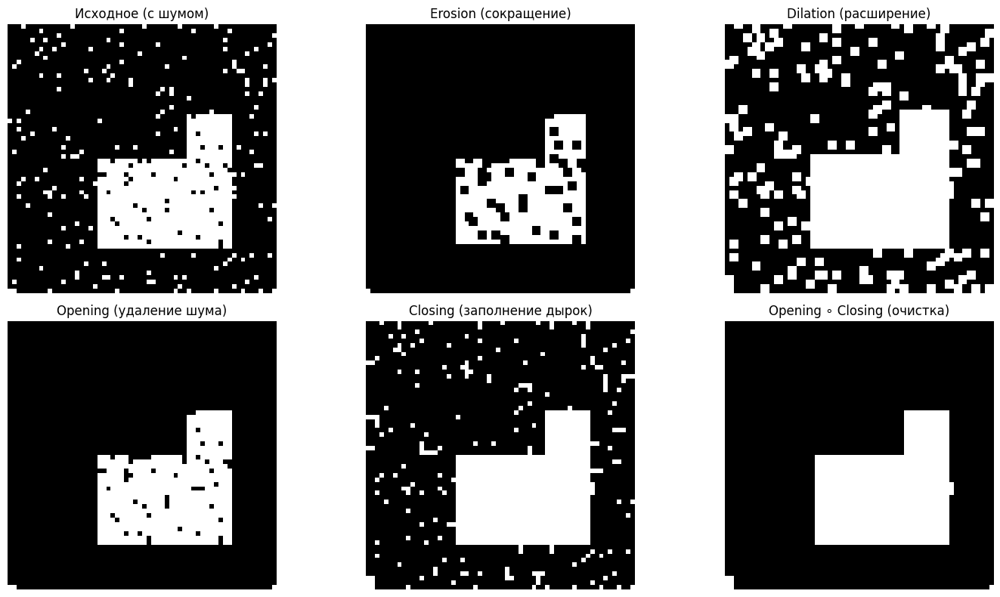

In [27]:
# Создаём синтетическое бинарное изображение с шумом
binary_noisy = np.zeros((60, 60), dtype=np.uint8)
binary_noisy[20:50, 20:50] = 255
binary_noisy[20:30, 20:40] = 0

# Добавляем случайный шум
noise = (np.random.rand(60, 60) > 0.95).astype(np.uint8) * 255
binary_noisy = ((binary_noisy > 0) ^ (noise > 0)).astype(np.uint8) * 255

# binary_noisy = np.uint8(binary_noisy > 127) * 255

# Создаём структурный элемент
se = morphology.square(2)

# Применяем операции
eroded = morphology.erosion(binary_noisy, footprint=se)
dilated = morphology.dilation(binary_noisy, footprint=se)
opened = morphology.opening(binary_noisy, footprint=se)
closed = morphology.closing(binary_noisy, footprint=se)

fig, axes = plt.subplots(2, 3, figsize=(15, 8))

axes[0, 0].imshow(binary_noisy, cmap='gray')
axes[0, 0].set_title('Исходное (с шумом)')
axes[0, 0].axis('off')

axes[0, 1].imshow(eroded, cmap='gray')
axes[0, 1].set_title('Erosion (сокращение)')
axes[0, 1].axis('off')

axes[0, 2].imshow(dilated, cmap='gray')
axes[0, 2].set_title('Dilation (расширение)')
axes[0, 2].axis('off')

axes[1, 0].imshow(opened, cmap='gray')
axes[1, 0].set_title('Opening (удаление шума)')
axes[1, 0].axis('off')

axes[1, 1].imshow(closed, cmap='gray')
axes[1, 1].set_title('Closing (заполнение дырок)')
axes[1, 1].axis('off')

# Комбинация операций
opened_closed = morphology.opening(morphology.closing(binary_noisy, footprint=se), footprint=se)
axes[1, 2].imshow(opened_closed, cmap='gray')
axes[1, 2].set_title('Opening ∘ Closing (очистка)')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

## Детектор границ Canny

**Алгоритм Canny:**
1. Размытие Гаусса (подавление шума)
2. Вычисление градиента (Sobel)
3. Non-maximum suppression (утончение граней)
4. Double thresholding (два порога)
5. Edge tracking by hysteresis (связность)

**Преимущества:**
- Хорошее обнаружение реальных граней
- Локализация (тонкие края)
- Минимально двойных ответов

Реализация сложная, поэтому используем встроенную функцию.

In [ ]:
from skimage import feature

gray_test = cv2.imread('test_image_1_1.jpg', cv2.IMREAD_GRAYSCALE)[1300:1700, 2300:2700]

gray_binarized = cv2.adaptiveThreshold(gray_test, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 17, 4)

se = morphology.disk(1)
opened = morphology.opening(gray_binarized, footprint=se)

# Применяем детектор Canny
edges_canny = feature.canny(opened, sigma=1.5, low_threshold=0.1, high_threshold=0.3)

# Сравним с простой пороговой бинаризацией и Sobel
# threshold_simple = (magnitude_normalized > 50).astype(np.uint8) * 255

fig, axes = plt.subplots(1, 5, figsize=(20, 5))

axes[0].imshow(gray_test, cmap='gray')
axes[0].set_title('Оригинальное изображение')
axes[0].axis('off')

axes[1].imshow(gray_binarized, cmap='gray')
axes[1].set_title('Бинаризованное изображение')
axes[1].axis('off')

axes[2].imshow(opened, cmap='gray')
axes[2].set_title('opening')
axes[2].axis('off')

axes[3].imshow(edges_canny, cmap='gray')
axes[3].set_title('Canny детектор')
axes[3].axis('off')

axes[4].imshow(gray_test, cmap='gray')
axes[4].contour(edges_canny, colors='red', linewidths=1)
axes[4].set_title('Canny на оригинальном изображении')
axes[4].axis('off')

plt.tight_layout()
plt.show()

# print(f"Собель обнаружил {(threshold_simple > 0).sum()} пиксельных граней")
# print(f"Canny обнаружил {edges_canny.sum()} пиксельных граней")

## Преобразование Фурье (Fourier Transform)

**Определение:**
Дискретное преобразование Фурье (DFT) разлагает изображение на сумму синусоидальных компонент разных частот:

$$F(u, v) = \sum_{x=0}^{H-1} \sum_{y=0}^{W-1} I(x, y) \cdot e^{-2\pi i (ux/H + vy/W)}$$

**Интерпретация:**
- **Низкие частоты** — общая форма и яркость
- **Высокие частоты** — детали, границы, шум

**Применение:**
- Фильтрация в частотной области
- Быстрая свёртка (FFT)
- Сжатие (JPEG использует DCT)
- Поиск повторяющихся паттернов

In [ ]:
# Преобразование Фурье

gray_test = cv2.imread('test_image_1_1.jpg', cv2.IMREAD_GRAYSCALE)[1300:1700, 2300:2700]

fft_result = np.fft.fft2(gray_test)
fft_shifted = np.fft.fftshift(fft_result)

# Амплитуда и фаза
magnitude_fft = np.abs(fft_shifted)
phase_fft = np.angle(fft_shifted)

# Логарифмическая шкала для лучшей визуализации
log_magnitude = np.log1p(magnitude_fft)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

axes[0, 0].imshow(gray_test, cmap='gray')
axes[0, 0].set_title('Исходное изображение')
axes[0, 0].axis('off')

axes[0, 1].imshow(log_magnitude, cmap='gray')
axes[0, 1].set_title('FFT: log(амплитуда) в центре (ясная сторона)')
axes[0, 1].axis('off')

im2 = axes[0, 2].imshow(phase_fft, cmap='hsv')
axes[0, 2].set_title('FFT: фаза')
axes[0, 2].axis('off')
plt.colorbar(im2, ax=axes[0, 2])

# Низкочастотный фильтр
def create_circle_mask(shape, radius):
    """Создать круглую маску"""
    h, w = shape
    y, x = np.ogrid[-h//2:h-h//2, -w//2:w-w//2]
    return (x**2 + y**2) <= radius**2

low_pass_mask = create_circle_mask(gray_test.shape, 30)
high_pass_mask = ~low_pass_mask

# Применяем фильтры
fft_low_pass = fft_shifted * low_pass_mask
fft_high_pass = fft_shifted * high_pass_mask

# Обратное преобразование
img_low_pass = np.abs(np.fft.ifft2(np.fft.ifftshift(fft_low_pass)))
img_high_pass = np.abs(np.fft.ifft2(np.fft.ifftshift(fft_high_pass)))

axes[1, 0].imshow(low_pass_mask, cmap='gray')
axes[1, 0].set_title('Маска низких частот')
axes[1, 0].axis('off')

axes[1, 1].imshow(img_low_pass, cmap='gray', vmin=0, vmax=255)
axes[1, 1].set_title('После низкочастотного фильтра')
axes[1, 1].axis('off')

axes[1, 2].imshow(img_high_pass, cmap='gray')
axes[1, 2].set_title('После высокочастотного фильтра')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

### Сглаживание маски фильтра гауссовым размытием

Резкая круглая маска частот даёт резкую границу в частотной области, а обратное преобразование Фурье от такой маски приводит к артефактам звона (ringing, эффект Гиббса) — на изображении появляются паразитные волнообразные кольца рядом с границами объектов.

Чтобы избавиться от этого эффекта, ту же круглую маску можно **размыть гауссовым фильтром**. Тогда переход от пропускаемых к подавляемым частотам становится плавным, и артефактов на выходном изображении заметно меньше.

In [ ]:
# Та же круглая маска, но размытая гауссовым фильтром
def create_blurred_circle_mask(shape, radius, sigma):
    """Круглая маска, размытая гауссовым фильтром (плавные края)"""
    mask = create_circle_mask(shape, radius).astype(np.float32)
    blurred_mask = cv2.GaussianBlur(mask, (0, 0), sigmaX=sigma)
    return blurred_mask

sigma_blur = 10
low_pass_mask_blurred = create_blurred_circle_mask(gray_test.shape, 30, sigma_blur)
high_pass_mask_blurred = 1.0 - low_pass_mask_blurred

# Применяем размытые фильтры
fft_low_pass_blurred = fft_shifted * low_pass_mask_blurred
fft_high_pass_blurred = fft_shifted * high_pass_mask_blurred

img_low_pass_blurred = np.abs(np.fft.ifft2(np.fft.ifftshift(fft_low_pass_blurred)))
img_high_pass_blurred = np.abs(np.fft.ifft2(np.fft.ifftshift(fft_high_pass_blurred)))

fig, axes = plt.subplots(2, 4, figsize=(20, 9))

axes[0, 0].imshow(low_pass_mask, cmap='gray')
axes[0, 0].set_title('Резкая круглая маска')
axes[0, 0].axis('off')

axes[0, 1].imshow(img_low_pass, cmap='gray', vmin=0, vmax=255)
axes[0, 1].set_title('Результат: резкая маска\n(виден эффект звона)')
axes[0, 1].axis('off')

axes[0, 2].imshow(high_pass_mask, cmap='gray')
axes[0, 2].set_title('Резкая ВЧ маска')
axes[0, 2].axis('off')

axes[0, 3].imshow(img_high_pass, cmap='gray')
axes[0, 3].set_title('Результат: резкая ВЧ маска')
axes[0, 3].axis('off')

axes[1, 0].imshow(low_pass_mask_blurred, cmap='gray')
axes[1, 0].set_title('Размытая гауссом маска')
axes[1, 0].axis('off')

axes[1, 1].imshow(img_low_pass_blurred, cmap='gray', vmin=0, vmax=255)
axes[1, 1].set_title('Результат: размытая маска\n(без звона)')
axes[1, 1].axis('off')

axes[1, 2].imshow(high_pass_mask_blurred, cmap='gray')
axes[1, 2].set_title('Размытая гауссом ВЧ маска')
axes[1, 2].axis('off')

axes[1, 3].imshow(img_high_pass_blurred, cmap='gray')
axes[1, 3].set_title('Результат: размытая ВЧ маска')
axes[1, 3].axis('off')

plt.tight_layout()
plt.show()

---

# Часть 5: Геометрические преобразования изображений

## Интерполяция (Interpolation)

**Проблема:**
При масштабировании или повороте изображения, новые пиксели обычно попадают между старыми. Нужно интерполировать значение.

### Nearest Neighbor (Ближайший сосед)
$$I'(x, y) = I(\text{round}(x), \text{round}(y))$$

**Плюсы:** Быстро, сохраняет точные значения  
**Минусы:** Артефакты, пиксельный эффект

### Billinear (Билинейная)
$$I'(x, y) = \sum_{i=0}^{1} \sum_{j=0}^{1} w_i(x) \cdot w_j(y) \cdot I(\lfloor x \rfloor + i, \lfloor y \rfloor + j)$$

где $w$ — линейные веса.

**Плюсы:** Хороший баланс качество/скорость  
**Минусы:** Может быть размыто

### Bicubic (Бикубическая)
Использует 16 соседних пикселей, кубические базисные функции.

**Плюсы:** Высокое качество  
**Минусы:** Медленнее, может быть оверинг

In [ ]:
from scipy.ndimage import zoom
from scipy.interpolate import RectBivariateSpline

# Создаём маленькое изображение для демонстрации
small_pattern = np.array([[0, 0, 255],
                           [0, 255, 0],
                           [255, 0, 0]], dtype=np.uint8)

scale_factor = 30

# Масштабируем разными методами
nearest = zoom(small_pattern, scale_factor, order=0)
bilinear = zoom(small_pattern, scale_factor, order=1)
bicubic = zoom(small_pattern, scale_factor, order=3)

fig, axes = plt.subplots(1, 4, figsize=(16, 4))

axes[0].imshow(small_pattern)
axes[0].set_title('Исходное (3×3)')
axes[0].axis('off')

axes[1].imshow(nearest, interpolation='nearest')
axes[1].set_title('Nearest Neighbor')
axes[1].axis('off')

axes[2].imshow(bilinear, interpolation='bilinear')
axes[2].set_title('Bilinear')
axes[2].axis('off')

axes[3].imshow(bicubic, interpolation='bicubic')
axes[3].set_title('Bicubic')
axes[3].axis('off')

plt.tight_layout()
plt.show()

print(f"Размер результата: {nearest.shape}")

## Аффинные преобразования (Affine Transformations)

**Определение:**
Преобразование, сохраняющее параллельные линии (параллелизм):

$$\begin{bmatrix} x' \\ y' \end{bmatrix} = \begin{bmatrix} a & b \\ c & d \end{bmatrix} \begin{bmatrix} x \\ y \end{bmatrix} + \begin{bmatrix} e \\ f \end{bmatrix}$$

или в однородных координатах:
$$\begin{bmatrix} x' \\ y' \\ 1 \end{bmatrix} = \begin{bmatrix} a & b & e \\ c & d & f \\ 0 & 0 & 1 \end{bmatrix} \begin{bmatrix} x \\ y \\ 1 \end{bmatrix}$$

**Примеры:**
- Масштабирование
- Поворот
- Сдвиг (translation)
- Наклон (shear)

---

### Матрицы базовых аффинных преобразований

Все преобразования ниже записаны в однородных координатах $3\times 3$, что позволяет комбинировать их простым умножением матриц.

**Сдвиг (translation)** на вектор $(t_x, t_y)$:
$$T = \begin{bmatrix} 1 & 0 & t_x \\ 0 & 1 & t_y \\ 0 & 0 & 1 \end{bmatrix}$$

**Масштабирование (scale)** с коэффициентами $(s_x, s_y)$ относительно начала координат:
$$S = \begin{bmatrix} s_x & 0 & 0 \\ 0 & s_y & 0 \\ 0 & 0 & 1 \end{bmatrix}$$

**Поворот (rotation)** на угол $\theta$ (против часовой стрелки) относительно начала координат:
$$R = \begin{bmatrix} \cos\theta & -\sin\theta & 0 \\ \sin\theta & \cos\theta & 0 \\ 0 & 0 & 1 \end{bmatrix}$$

**Наклон (shear)** вдоль оси X с коэффициентом $k$:
$$Sh = \begin{bmatrix} 1 & k & 0 \\ 0 & 1 & 0 \\ 0 & 0 & 1 \end{bmatrix}$$

**Важно:** поворот и масштабирование по умолчанию выполняются относительно точки $(0, 0)$ (левый верхний угол). Чтобы повернуть/отмасштабировать вокруг произвольного центра $(c_x, c_y)$, нужно скомбинировать три преобразования: сдвиг центра в начало координат, само преобразование, сдвиг обратно:

$$M = T(c_x, c_y) \cdot R(\theta) \cdot T(-c_x, -c_y)$$

Именно так работает `cv2.getRotationMatrix2D` в OpenCV — она сразу возвращает готовую матрицу $2\times 3$ для поворота вокруг заданного центра с учётом масштаба.

---

### Аффинные преобразования в OpenCV

OpenCV работает с матрицами аффинных преобразований размера $2\times 3$ (последняя строка $[0, 0, 1]$ подразумевается неявно) и применяет их функцией `cv2.warpAffine`.


In [ ]:
# Загружаем тестовое изображение и берём его размеры
img_affine = gray_test.copy()
h_a, w_a = img_affine.shape[:2]

# ------------------------------------------------------------------
# 1. Сдвиг (translation): матрица 2x3 вручную
# ------------------------------------------------------------------
tx, ty = 60, 30
M_translate = np.float32([
    [1, 0, tx],
    [0, 1, ty],
])
translated = cv2.warpAffine(img_affine, M_translate, (w_a, h_a))

# ------------------------------------------------------------------
# 2. Масштабирование (scale): матрица 2x3 вручную
# ------------------------------------------------------------------
sx, sy = 1.4, 0.7
M_scale = np.float32([
    [sx, 0,  0],
    [0,  sy, 0],
])
scaled = cv2.warpAffine(img_affine, M_scale, (w_a, h_a))

# ------------------------------------------------------------------
# 3. Поворот (rotation) вокруг центра изображения: через cv2.getRotationMatrix2D
#    (эта функция сама строит матрицу T(c) * R(theta) * T(-c), опционально с масштабом)
# ------------------------------------------------------------------
center = (w_a // 2, h_a // 2)
angle_deg = 30
scale = 1.0
M_rotate = cv2.getRotationMatrix2D(center, angle_deg, scale)
rotated_cv = cv2.warpAffine(img_affine, M_rotate, (w_a, h_a))

# ------------------------------------------------------------------
# 4. Наклон (shear) вдоль оси X: матрица 2x3 вручную
# ------------------------------------------------------------------
k_shear = 0.3
M_shear = np.float32([
    [1, k_shear, 0],
    [0, 1,       0],
])
sheared = cv2.warpAffine(img_affine, M_shear, (w_a, h_a))

print("Матрица сдвига:\n", M_translate)
print("Матрица масштабирования:\n", M_scale)
print("Матрица поворота (getRotationMatrix2D):\n", M_rotate)
print("Матрица наклона:\n", M_shear)

fig, axes = plt.subplots(1, 5, figsize=(20, 4))

axes[0].imshow(img_affine, cmap='gray')
axes[0].set_title('Исходное изображение')
axes[0].axis('off')

axes[1].imshow(translated, cmap='gray')
axes[1].set_title(f'Сдвиг (tx={tx}, ty={ty})')
axes[1].axis('off')

axes[2].imshow(scaled, cmap='gray')
axes[2].set_title(f'Масштаб (sx={sx}, sy={sy})')
axes[2].axis('off')

axes[3].imshow(rotated_cv, cmap='gray')
axes[3].set_title(f'Поворот на {angle_deg}° (getRotationMatrix2D)')
axes[3].axis('off')

axes[4].imshow(sheared, cmap='gray')
axes[4].set_title(f'Наклон (k={k_shear})')
axes[4].axis('off')

plt.tight_layout()
plt.show()

## Перспективные преобразования (Perspective)

**Определение:**
Более общее преобразование, не сохраняющее параллелизм (моделирует изменение угла обзора):

$$\begin{bmatrix} x' \\ y' \\ w \end{bmatrix} = \begin{bmatrix} h_{11} & h_{12} & h_{13} \\ h_{21} & h_{22} & h_{23} \\ h_{31} & h_{32} & h_{33} \end{bmatrix} \begin{bmatrix} x \\ y \\ 1 \end{bmatrix}$$

$$x'_n = \frac{x'}{w}, \quad y'_n = \frac{y'}{w}$$

**Применение:**
- Коррекция перспективы отсканированных документов
- Исправление наклона камеры
- Досягаемость в компьютерной графике

---

# Часть 6: Поиск паттернов (Pattern Matching)

## Корреляция и сравнение (Correlation/Comparison)

**Задача:**
Найти область в большом изображении, которая лучше всего совпадает с шаблоном.

**Метрики сходства:**

### Mean Squared Error (MSE)
$$\text{MSE} = \frac{1}{HW} \sum_{x,y} [I(x,y) - T(x,y)]^2$$

**Хороший результат:** минимальное значение

### Cross-Correlation
$$\text{CC} = \sum_{x,y} I(x,y) \cdot T(x,y)$$

**Хороший результат:** максимальное значение

### Normalized Cross-Correlation (NCC)
$$\text{NCC} = \frac{\sum_{x,y} (I(x,y) - \bar{I})(T(x,y) - \bar{T})}{\sqrt{\sum (I - \bar{I})^2 \sum (T - \bar{T})^2}}$$

**Преимущество:** инвариантна к сдвигу интенсивности

In [ ]:
# Создаём большое изображение с шаблоном где-то внутри
large_img = np.random.uniform(100, 150, (300, 300)).astype(np.uint8)

# Вставляем шаблон
template = np.ones((40, 40), dtype=np.uint8) * 200
template[10:20, 10:20] = 50  # Маленький чёрный квадрат
for i in range(20):
    template[i, i] = 0
    template[i, 20 - i] = 128
    
large_img[100:140, 120:160] = template

# Поиск через MSE
def match_template_mse(img, template):
    """Поиск шаблона через MSE"""
    h_t, w_t = template.shape
    h_i, w_i = img.shape
    
    result = np.zeros((h_i - h_t + 1, w_i - w_t + 1))
    
    for y in range(h_i - h_t + 1):
        for x in range(w_i - w_t + 1):
            patch = img[y:y+h_t, x:x+w_t]
            mse = np.mean((patch.astype(np.float32) - template.astype(np.float32))**2)
            result[y, x] = mse
    
    return result

result_mse = match_template_mse(large_img, template)
best_location = np.unravel_index(result_mse.argmin(), result_mse.shape)

fig, axes = plt.subplots(2, 2, figsize=(14, 12))

axes[0, 0].imshow(large_img, cmap='gray')
axes[0, 0].set_title('Большое изображение с встроенным шаблоном')
axes[0, 0].axis('off')

axes[0, 1].imshow(template, cmap='gray')
axes[0, 1].set_title('Шаблон')
axes[0, 1].axis('off')

im = axes[1, 0].imshow(result_mse, cmap='hot')
axes[1, 0].set_title('Карта MSE (тёмнее = ближе)')
axes[1, 0].plot(best_location[1], best_location[0], 'b*', markersize=15)
plt.colorbar(im, ax=axes[1, 0])

# Визуализируем результат
result_vis = large_img.copy()
y, x = best_location
result_vis[y:y+template.shape[0], x:x+template.shape[1]] = 255

axes[1, 1].imshow(result_vis, cmap='gray')
axes[1, 1].set_title(f'Результат поиска (найдено в ({x}, {y}))')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

print(f"Шаблон был встроен в позицию (100, 120)")
print(f"Поиск нашёл позицию {best_location}")

## Быстрый поиск через FFT

**Идея:**
Свёртка в пространственной области эквивалентна умножению в частотной области:
$$I' = IFFT(FFT(I) \otimes FFT(K))$$

**Сложность:**
- Наивная свёртка: $O(H \cdot W \cdot K^2)$
- FFT-свёртка: $O(HW \log(HW))$

Для больших изображений FFT намного быстрее.

In [ ]:
def match_template_fft(img, template):
    """Быстрый поиск шаблона через FFT (cross-correlation)"""
    # Pad template
    padded_template = np.zeros_like(img)
    padded_template[:template.shape[0], :template.shape[1]] = template
    
    # FFT
    fft_img = np.fft.fft2(img.astype(np.float32))
    fft_template = np.fft.fft2(padded_template.astype(np.float32))
    
    # Умножение в частотной области
    correlation = fft_img * np.conj(fft_template)
    
    # Обратное преобразование
    result = np.fft.ifft2(correlation).real
    
    return result

result_fft = match_template_fft(large_img, template)
best_location_fft = np.unravel_index(result_fft.argmax(), result_fft.shape)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

im0 = axes[0].imshow(result_fft, cmap='hot')
axes[0].set_title('Cross-Correlation через FFT')
axes[0].scatter(best_location_fft[1], best_location_fft[0], s=45, marker='x', color='green')
plt.colorbar(im0, ax=axes[0])

# Результат
result_vis_fft = large_img.copy()
y, x = best_location_fft
result_vis_fft[y:y+template.shape[0], x:x+template.shape[1]] = 255

axes[1].imshow(result_vis_fft, cmap='gray')
axes[1].set_title(f'Результат FFT поиска')
axes[1].axis('off')

plt.tight_layout()
plt.show()

print(f"FFT поиск нашёл позицию {best_location_fft}")

## Заключение лекции

Мы рассмотрели основные компоненты компьютерного зрения:

1. **Форматы представления** — RGB, YCbCr, HSV, CMYK, Grayscale
2. **Работа с цветом** — гамма-коррекция, гистограммы, баланс белого
3. **Блендинг** — альфа-блендинг
4. **Фильтрация** — свёртка, Собель, Лапласиан, морфология, Canny
5. **Частотные методы** — Фурье, фильтрация в частотной области (в т.ч. с гауссовым размытием маски), DCT
6. **Геометрия** — интерполяция, аффинные и перспективные преобразования
7. **Поиск паттернов** — корреляция, FFT